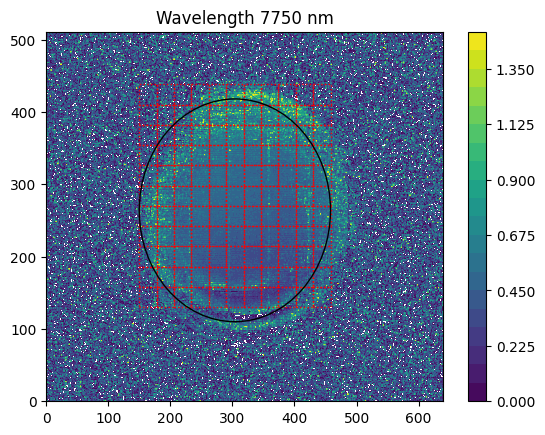

In [17]:
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
import matplotlib.patches as patches

yw = np.arange(5000,15000,10)
z0 = np.where(yw == 7670)

#read python analysis data
path_ref,path_sam = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/','C:/Users/daik/sokendai/N2O/experiment data/UV/zipdata/1114/'
Zs_tg = np.load('C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1114/tg.npy')
Zs_ref = np.load('C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/ref.npy')
Absorb = np.log10(Zs_ref/Zs_tg)



ax = plt.axes()

nx0, ny0 = Absorb.shape[2], Absorb.shape[1]
x0 = np.arange(0,nx0,1)
y0 = np.arange(0,ny0,1)

#plot contour map
cb_min, cb_max = 0, 1.5
cb_div = 20
interval_of_cf = np.linspace(cb_min, cb_max, cb_div+1)

plt.contourf(x0,y0, Absorb[z0[0][0]],interval_of_cf)
#plt.plot(400,300,'.',color="red")
#plt.plot(300,400,'.',color="red")

xst,yst = 150,130
xbin,ybin,sbin = 11,11,28

#c1 = patches.Rectangle((xst,yst),sbin*xbin,sbin*ybin,lw=2,ec='r',fill=False)
for i in range(xbin):
    for j in range(ybin):
        cn = patches.Rectangle((xst+sbin*i,yst+sbin*j),sbin,sbin,lw=1,ec='r',linestyle='dotted',fill=False)
        ax.add_patch(cn)
        
#ax.add_patch(c1)
x_cir, y_cir, r_cir = 304,264,154
c1 = patches.Circle(xy=(x_cir, y_cir), radius=r_cir, fc='g', fill=False)
ax.add_patch(c1)

plt.colorbar()
sPath = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1214/'
plt.title("Wavelength 7750 nm")
#plt.savefig(sPath+ path_sam +"N2O frost.png",dpi=300)
plt.show()

In [28]:
import numpy as np
import pandas as pd

# パスの設定
path_ref = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/'
path_sam = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1837/'

# 波長関連のパラメータ設定
nw = 1000  
yw = np.linspace(7000, 8000, nw)  

# 11×11グリッドの設定
np_x = 11  
np_y = 11  
sbin = 46  

# 開始位置の配列を生成
x0 = np.arange(0, 640, sbin)[:11]  
y0 = np.arange(0, 512, sbin)[:11]  

# 7660nmに最も近い波長のインデックスを取得
target_wavelength = 7660
wavelength_idx = np.argmin(np.abs(yw - target_wavelength))

# データ読み込み
Zs_tg = np.load(path_sam + 'tg.npy')
Zs_ref = np.load(path_ref + 'ref.npy')
Absorb = np.log10(Zs_ref/Zs_tg)

New_spec = np.zeros((nw,np_y,np_x))

# 各グリッドの吸光度計算
for i in range(np_y):
    for j in range(np_x):
        pix_x,pix_y = x0[j],y0[i]
        for k in range(nw):
            New_spec[k,i,j] = np.average(Absorb[k,pix_y:pix_y+sbin,pix_x:pix_x+sbin])

# 特定波長での吸光度値を取得
absorbance_values = New_spec[wavelength_idx, :, :]

# DataFrameの作成
df_absorbance = pd.DataFrame(absorbance_values)
df_absorbance.columns = [f'j{j+1}' for j in range(np_x)]
df_absorbance.index = [f'i{i+1}' for i in range(np_y)]

# CSVファイルとして保存
csv_filename = f'absorbance_values_{target_wavelength}nm_1837.csv'
full_path = path_sam + csv_filename
df_absorbance.to_csv(full_path)

print(f"波長 {yw[wavelength_idx]}nm での各グリッドの吸光度値を保存しました：")
print(f"保存先: {full_path}")
print(df_absorbance)


波長 7659.65965965966nm での各グリッドの吸光度値を保存しました：
保存先: C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1837/absorbance_values_7660nm_1837.csv
           j1        j2        j3        j4        j5        j6        j7  \
i1   0.011666  0.024836  0.017271  0.019404  0.017623  0.006073  0.009828   
i2   0.001271  0.014484  0.004961  0.019591  0.010844  0.003240 -0.014036   
i3   0.013370  0.006082  0.008689  0.005594  0.171091  0.201033  0.205301   
i4   0.004993  0.011367  0.011408  0.165214  0.205001  0.174235  0.110247   
i5   0.023840  0.007883 -0.004468  0.249864  0.202240  0.058953 -0.027713   
i6   0.027783  0.040844 -0.024674  0.181086  0.153691 -0.026840 -0.157194   
i7   0.027376  0.068477 -0.028433  0.141300  0.208081  0.025241 -0.197531   
i8  -0.003952  0.016214  0.020976  0.145382  0.147137  0.341883  0.085217   
i9   0.005599  0.016733  0.033094  0.072252  0.199005  0.111796  0.200245   
i10  0.021308  0.004448  0.020140  0.022507  0.029210  0.271735  0.310091   
i11  0.0174

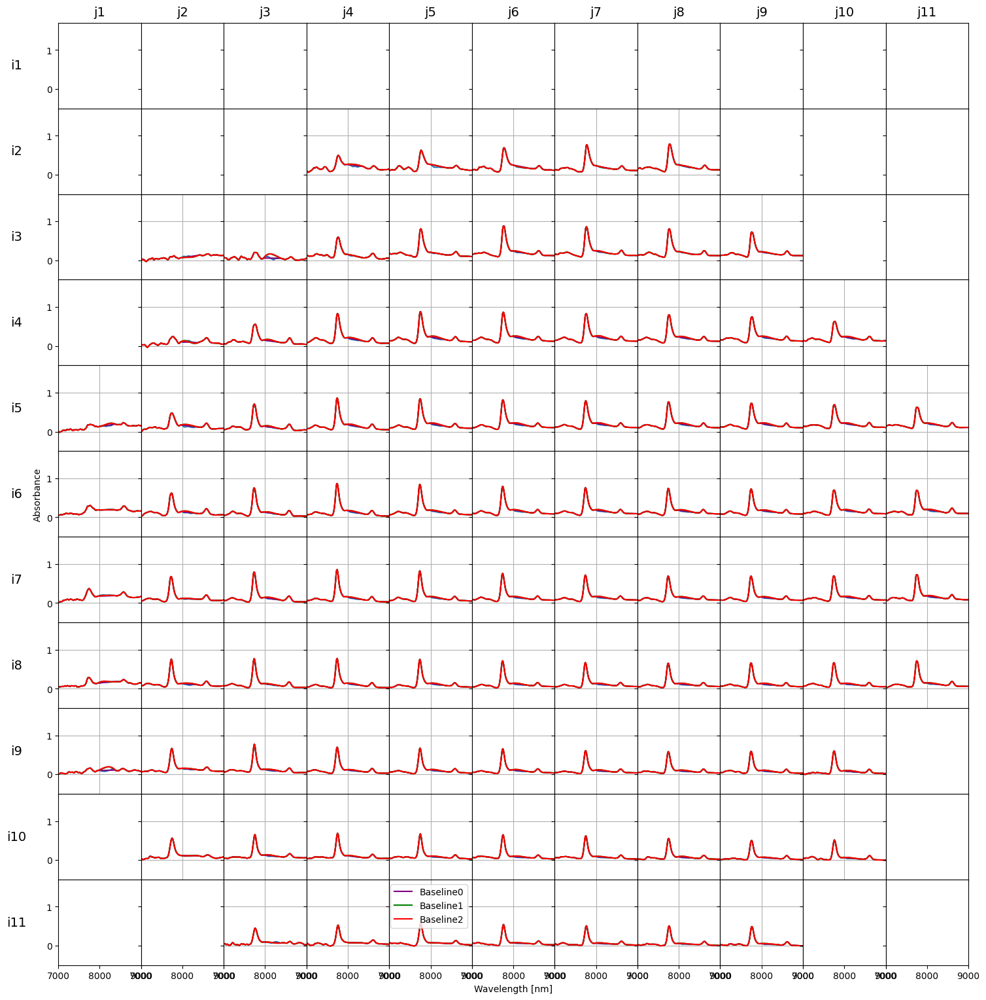

In [63]:
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
from scipy import interpolate

yw = np.arange(5000,15000,10)
nw = len(yw)

#read python analysis data
path_ref,path_sam = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/','C:/Users/daik/sokendai/N2O/experiment data/UV/zipdata/1014/'
Zs_tg = np.load('C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1014/tg.npy')
Zs_ref = np.load('C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/ref.npy')
Absorb = np.log10(Zs_ref/Zs_tg)

#pixel x,y
xst,yst = 150,130
xbin,ybin,sbin = 11,11,28
x0 = np.arange(xst,xst+xbin*sbin,sbin)
y0 = np.arange(yst,yst+ybin*sbin,sbin)

#Estimated hole shape prarameter
x_cir, y_cir, r_cir = 304,264,154

np_x, np_y = len(x0),len(y0)
New_spec = np.zeros((nw,np_y,np_x))
xcor0 = np.where((yw<7970)|(yw>8370))##;+-about200 

fig, ax = plt.subplots(np_x,np_y, sharex=True, sharey=True, constrained_layout=False, figsize=(16,16))

# グラフ全体の位置調整を先に設定
plt.subplots_adjust(hspace=0.0, wspace=0.0, left=0.08, right=0.95, bottom=0.05, top=0.95)

# 行インデックス (i1-i11)
for i in range(np_y):
    fig.text(0.04, 0.95 - ((i+0.5)/11)*0.9, f'i{i+1}', fontsize=14, ha='center', va='center')

# 列インデックス (j1-j11)
for j in range(np_x):
    x_pos = 0.08 + (0.95-0.08)*((j+0.5)/11)
    fig.text(x_pos, 0.96, f'j{j+1}', fontsize=14, ha='center', va='center')

for i in range(np_y): #y
    for j in range(np_x): #x
        n = int(i+3*j) #figure number
        pix_x,pix_y = x0[j],y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        #judge the region is inside the hole
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix>r_cir:
            ax[np_y-i-1,j].set_facecolor('1.0')
            continue
        
        for k in range(nw):
            New_spec[k,i,j] = np.average(Absorb[k,pix_y:pix_y+sbin,pix_x:pix_x+sbin])
        #####fft conversion and plot results#################
        ax[np_y-i-1,j].plot(yw,New_spec[:,i,j])
        
        #Spline interpolation (2nd order)
        fcor0 = interpolate.interp1d(yw[xcor0], New_spec[xcor0,i,j])
        fcor = interpolate.interp1d(yw[xcor0], New_spec[xcor0,i,j], kind="quadratic")
        fcor2 = interpolate.interp1d(yw[xcor0], New_spec[xcor0,i,j], kind="cubic")
        ax[np_y-i-1,j].plot(yw,fcor0(yw)[0],color='purple',label='Baseline0')
        ax[np_y-i-1,j].plot(yw,fcor(yw)[0],color='green',label='Baseline1')
        ax[np_y-i-1,j].plot(yw,fcor2(yw)[0],color='red',label='Baseline2')
        
        #graph config.
        ax[np_y-i-1,j].set_xlim([7000,9000])
        ax[np_y-i-1,j].set_ylim([-0.5,1.7])
        ax[np_y-i-1,j].grid()

ax[10,4].legend()
ax[5,0].set_ylabel("Absorbance")
ax[10,5].set_xlabel("Wavelength [nm]")
plt.show()


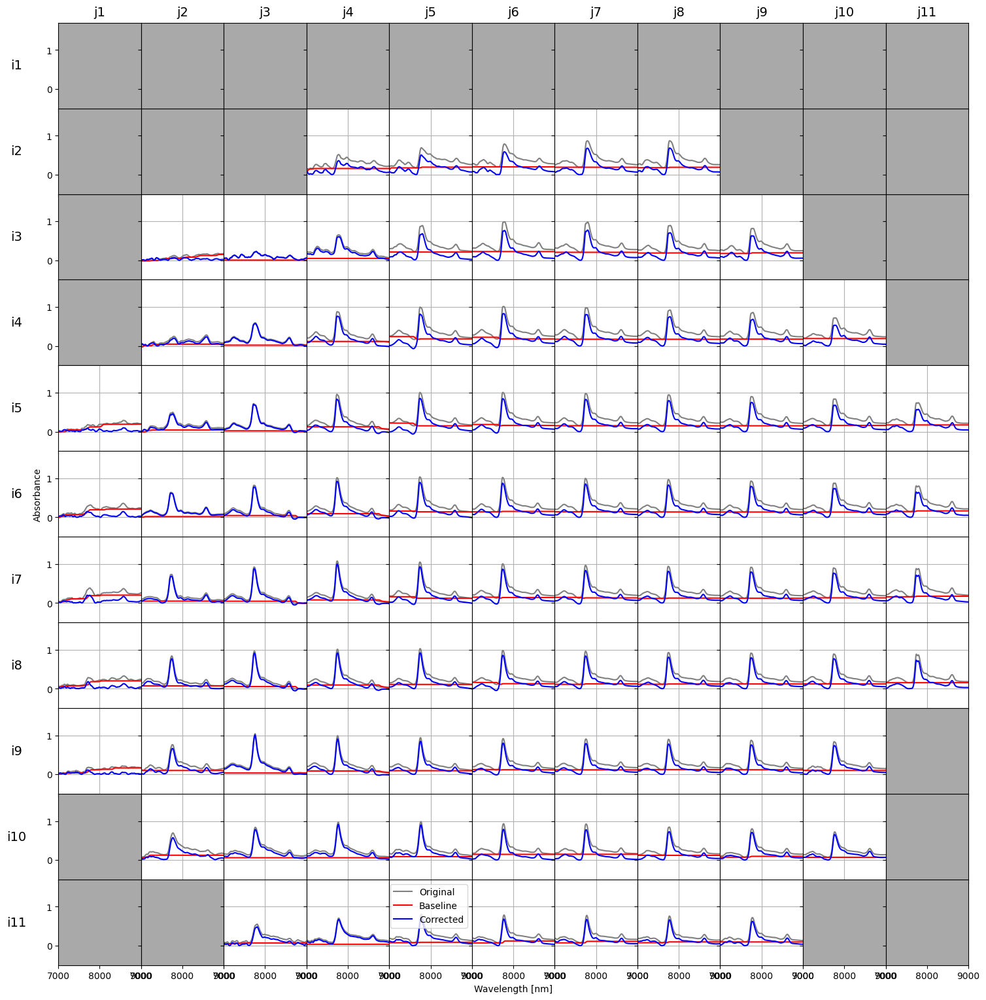

In [3]:
# 必要なライブラリのインポート
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
from scipy import interpolate

def rolling_ball_baseline(y, window_size=150, iterations=5):
    """
    超高精度Rolling Ball法によるベースライン補正
    """
    # スペクトルの特徴スケールに基づく適応的なwindow size
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    
    # エッジ効果を軽減するための拡張
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    
    # マルチスケール処理
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(
                window=size, 
                center=True, 
                min_periods=1
            ).min()
            rolling_max = pd.Series(rolling_min).rolling(
                window=size, 
                center=True, 
                min_periods=1
            ).max()
            baseline = rolling_max.values
    
    # スムージング処理
    baseline = pd.Series(baseline).rolling(
        window=5, 
        center=True, 
        min_periods=1
    ).mean().values
    
    return baseline[adaptive_window//2:-adaptive_window//2]

def estimate_peak_width(y):
    """
    スペクトルのピーク幅を推定
    """
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# 波長範囲の設定
yw = np.arange(5000,15000,10)
nw = len(yw)

# 実験データの読み込み
path_ref,path_sam = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/','C:/Users/daik/sokendai/N2O/experiment data/UV/zipdata/1044/'
Zs_tg = np.load('C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1044/tg.npy')
Zs_ref = np.load('C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/ref.npy')
Absorb = np.log10(Zs_ref/Zs_tg)

# 解析領域の設定
xst,yst = 150,130
xbin,ybin,sbin = 11,11,28
x0 = np.arange(xst,xst+xbin*sbin,sbin)
y0 = np.arange(yst,yst+ybin*sbin,sbin)

# 円形測定領域のパラメータ
x_cir, y_cir, r_cir = 304,264,154

# スペクトルデータ配列の初期化
np_x, np_y = len(x0),len(y0)
New_spec = np.zeros((nw,np_y,np_x), dtype=np.float64)

# プロットの設定
fig, ax = plt.subplots(np_x,np_y, sharex=True, sharey=True, constrained_layout=False, figsize=(16,16))
plt.subplots_adjust(hspace=0.0, wspace=0.0, left=0.08, right=0.95, bottom=0.05, top=0.95)

# グリッドインデックスの表示設定
for i in range(np_y):
    fig.text(0.04, 0.95 - ((i+0.5)/11)*0.9, f'i{i+1}', fontsize=14, ha='center', va='center')

for j in range(np_x):
    x_pos = 0.08 + (0.95-0.08)*((j+0.5)/11)
    fig.text(x_pos, 0.96, f'j{j+1}', fontsize=14, ha='center', va='center')

# メインの解析ループ
for i in range(np_y):
    for j in range(np_x):
        pix_x,pix_y = x0[j],y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix>r_cir:
            ax[np_y-i-1,j].set_facecolor('darkgray')
            continue
        
        for k in range(nw):
            New_spec[k,i,j] = np.average(Absorb[k,pix_y:pix_y+sbin,pix_x:pix_x+sbin])
        
        # 超高精度ベースライン補正の適用
        baseline = rolling_ball_baseline(New_spec[:,i,j])
        corrected_spectrum = New_spec[:,i,j] - baseline
        
        ax[np_y-i-1,j].plot(yw, New_spec[:,i,j], color='gray', label='Original')
        ax[np_y-i-1,j].plot(yw, baseline, color='red', label='Baseline')
        ax[np_y-i-1,j].plot(yw, corrected_spectrum, color='blue', label='Corrected')
        
        ax[np_y-i-1,j].set_xlim([7000,9000])
        ax[np_y-i-1,j].set_ylim([-0.5,1.7])
        ax[np_y-i-1,j].grid()

# グラフの体裁設定
ax[10,4].legend()
ax[5,0].set_ylabel("Absorbance")
ax[10,5].set_xlabel("Wavelength [nm]")
plt.show()


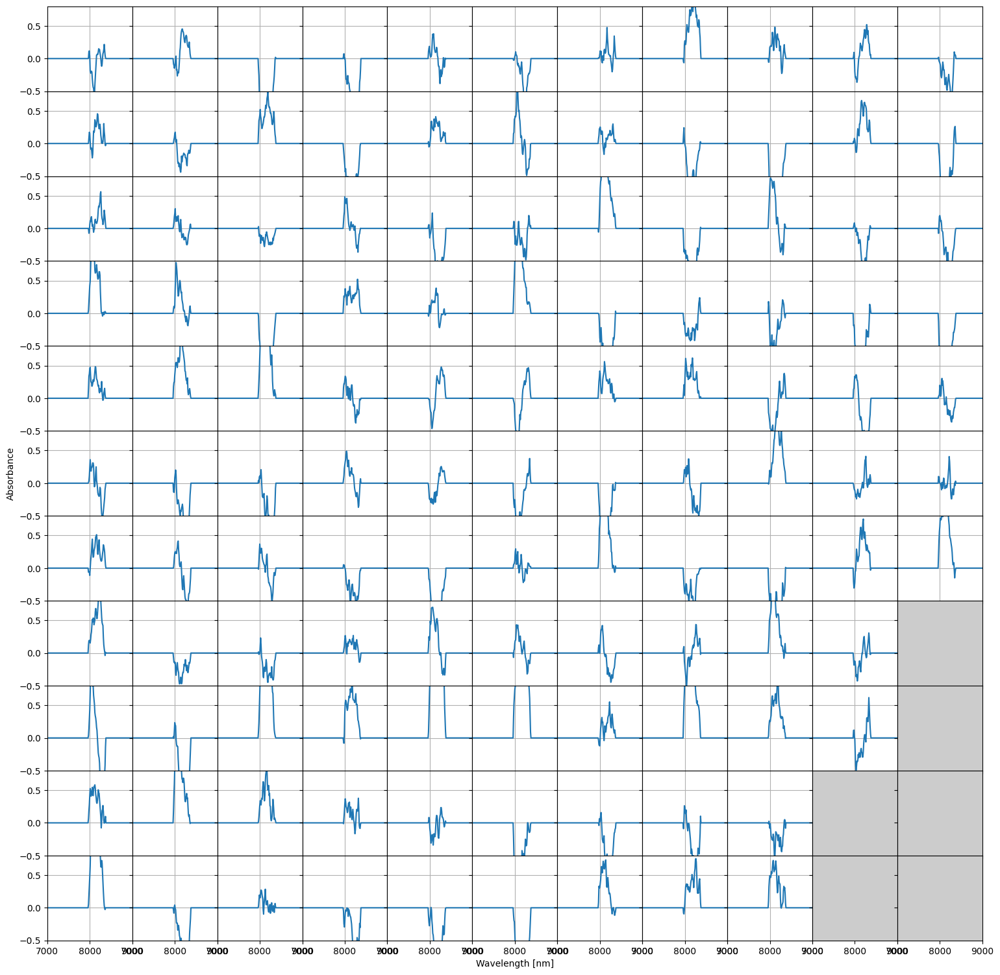

In [59]:
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
from scipy import interpolate

yw = np.arange(7000,14000,10)
nw = len(yw)

#read python analysis data
path_ref,path_sam = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/','C:/Users/daik/sokendai/N2O/experiment data/UV/zipdata/1114/'
Zs_tg = np.load('C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1114/tg.npy')
Zs_ref = np.load('C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/ref.npy')
Absorb = np.log10(Zs_ref/Zs_tg)

#pixel x,y
xst,yst = 400,180
xbin,ybin,sbin = 11,11,3
x0 = np.arange(xst,xst+xbin*sbin,sbin)
y0 = np.arange(yst,yst+ybin*sbin,sbin)

#Estimated hole shape prarameter
x_cir, y_cir, r_cir = 304,264,154

np_x, np_y = len(x0),len(y0)
New_spec = np.zeros((nw,np_y,np_x))
xcor0 = np.where((yw<7970)|(yw>8370)) 

fig, ax = plt.subplots(np_x,np_y, sharex=True, sharey=True, constrained_layout=False, figsize=(16,16))
for i in range(np_y): #y
    for j in range(np_x): #x
        n = int(i+3*j) #figure number
        pix_x,pix_y = x0[j],y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        #judge the region is inside the hole
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix>r_cir:
            ax[np_y-i-1,j].set_facecolor('0.8')
            continue
        
        for k in range(nw):
            New_spec[k,i,j] = np.average(Absorb[k,pix_y:pix_y+sbin,pix_x:pix_x+sbin])
        #####fft conversion and plot results#################
        
        #Spline interpolation (2nd order)  スプライン補間による基準線補正後の差スペクトル
        fcor2 = interpolate.interp1d(yw[xcor0], New_spec[xcor0,i,j], kind="cubic")
        ax[np_y-i-1,j].plot(yw,New_spec[:,i,j]-fcor2(yw)[0],label='Baseline0')
        
        #graph config.
        ax[np_y-i-1,j].set_xlim([7000,9000])
        ax[np_y-i-1,j].set_ylim([-0.5,0.8])
        ax[np_y-i-1,j].grid()
        #ax[np_y-i-1,j].set_title("x="+str(pix_x)+", y="+str(pix_y))

#ax[10,5].legend()
#ax[1,0].set_ylabel("Absorbance")
#ax[2,1].set_xlabel("Wavelength [nm]")
plt.subplots_adjust(hspace=0.0,wspace=0.0,left=0.05, right=0.95, bottom=0.05, top=0.95)
ax[5,0].set_ylabel("Absorbance")
ax[10,5].set_xlabel("Wavelength [nm]")
#plt.savefig("python " + path_sam +" 11_11_nu3.png",dpi=300)
plt.show()

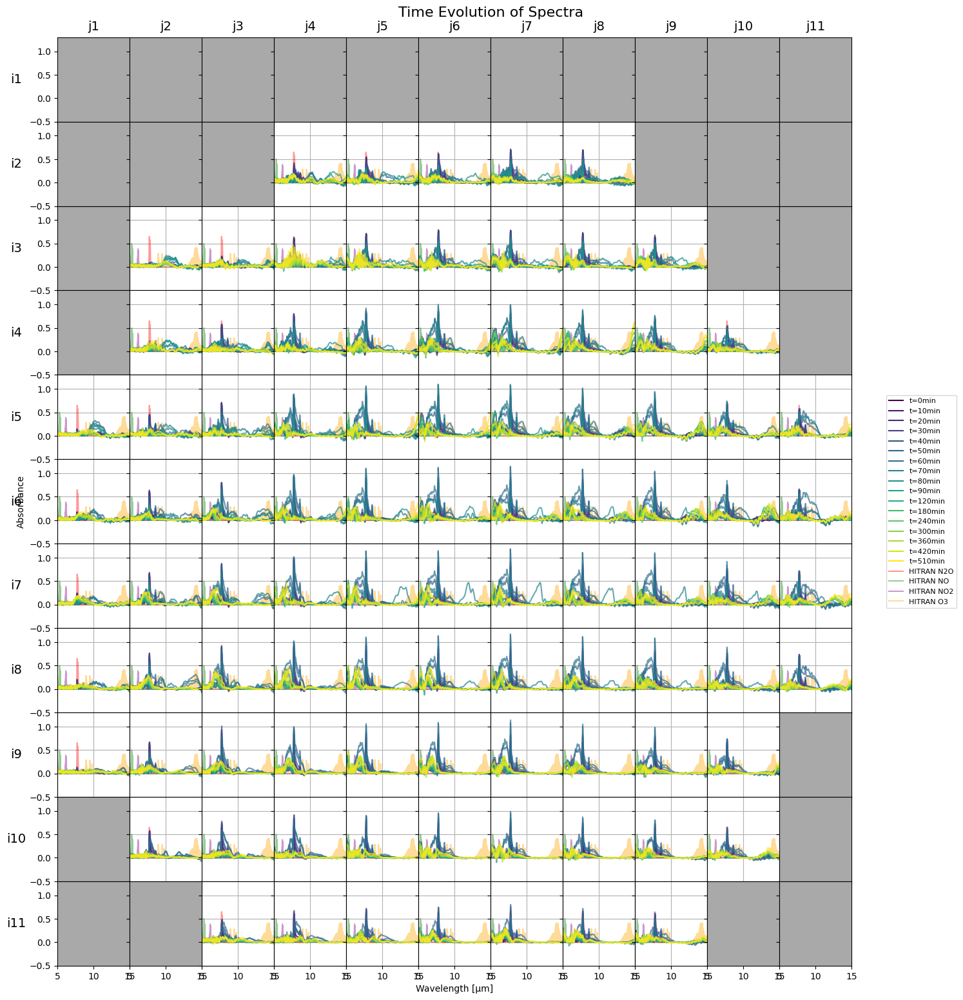

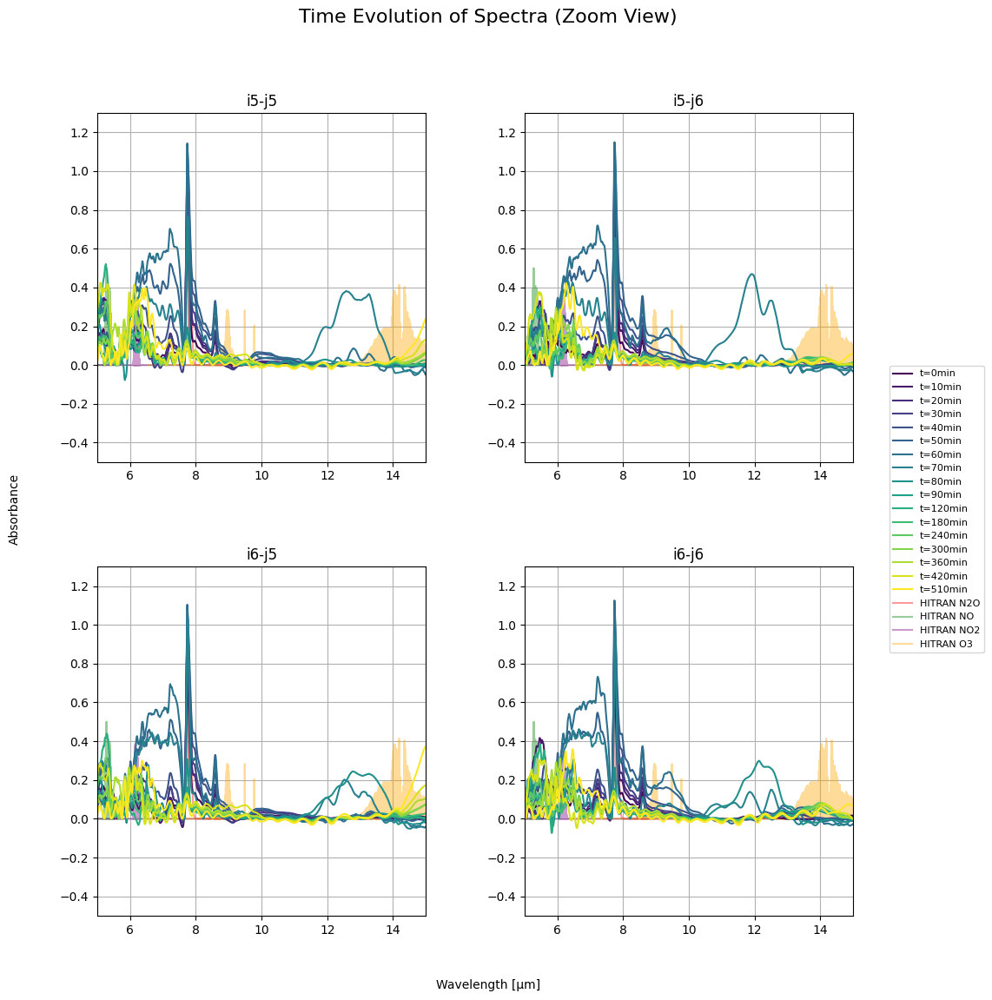

In [2]:
# 必要なライブラリのインポート - データ処理と可視化のための基本ライブラリ
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
from scipy import interpolate

# HITRANデータベースからの分子スペクトルデータの読み込みと数値変換
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# 文字列データを数値データに変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルのパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定（全時間）
selected_times = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 120, 180, 240, 300, 360, 420, 510]
selected_time_points = ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144', '1214', '1314', '1414', '1514', '1614', '1714', '1837']

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000
nw = len(yw)

# 空間分解能の設定
xst,yst = 150,130
xbin,ybin,sbin = 11,11,28
x0 = np.arange(xst,xst+xbin*sbin,sbin)
y0 = np.arange(yst,yst+ybin*sbin,sbin)

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304,264,154

# 時間発展を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_times)))

# 全体マップのプロット設定
fig, ax = plt.subplots(xbin,ybin, sharex=True, sharey=True, figsize=(16,16))
plt.subplots_adjust(hspace=0.0, wspace=0.0, left=0.08, right=0.85, bottom=0.05, top=0.95)

# グリッドインデックスの表示設定
for i in range(ybin):
    fig.text(0.04, 0.95 - ((i+0.5)/11)*0.9, f'i{i+1}', fontsize=14, ha='center', va='center')
for j in range(xbin):
    x_pos = 0.08 + (0.85-0.08)*((j+0.5)/11)
    fig.text(x_pos, 0.96, f'j{j+1}', fontsize=14, ha='center', va='center')

# メインの解析ループ - 各グリッドポイントでのスペクトル解析
for i in range(ybin):
    for j in range(xbin):
        pix_x,pix_y = x0[j],y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix>r_cir:
            ax[ybin-i-1,j].set_facecolor('darkgray')
            continue
            
        # HITRANリファレンスデータのプロット
        ax[ybin-i-1,j].plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
        ax[ybin-i-1,j].plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
        ax[ybin-i-1,j].plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
        ax[ybin-i-1,j].plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
        
        # 時間発展データの処理とプロット
        for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
            path_sam = base_path + time_point + '/'
            
            # データ読み込みと吸光度計算
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            
            # スペクトル処理
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            # 時間発展スペクトルのプロット
            ax[ybin-i-1,j].plot(yw, corrected_spectrum, color=colors[t_idx], label=f't={t}min', alpha=0.7)
        
        # グラフの表示範囲とグリッド設定
        ax[ybin-i-1,j].set_xlim([5,15])
        ax[ybin-i-1,j].set_ylim([-0.5,1.3])
        ax[ybin-i-1,j].grid()

# 軸ラベルの設定
ax[5,0].set_ylabel("Absorbance")
ax[10,5].set_xlabel("Wavelength [μm]")

# 凡例の設定
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min') 
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N2O', alpha=0.4),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO2', alpha=0.4),
    plt.Line2D([0], [0], color='orange', label='HITRAN O3', alpha=0.4)
]

# 凡例を図の右側に配置
fig.legend(handles=time_legend + hitran_legend, 
          loc='center left', 
          bbox_to_anchor=(0.88, 0.5),
          fontsize=8)

plt.suptitle('Time Evolution of Spectra', fontsize=16)
plt.show()

# 拡大表示の設定
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(12, 12))
plt.subplots_adjust(hspace=0.3, wspace=0.3)

# 拡大表示する領域の指定
i_indices = [4, 5]
j_indices = [4, 5]

# 拡大表示の作成
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # HITRANデータのプロット
        ax_zoom[idx_i, idx_j].plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
        
        # 時間発展データの処理とプロット
        for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
            path_sam = base_path + time_point + '/'
            
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            ax_zoom[idx_i, idx_j].plot(yw, corrected_spectrum, color=colors[t_idx])
        
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.5, 1.3])
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}')

# 拡大表示の凡例設定
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min') 
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N2O', alpha=0.4),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO2', alpha=0.4),
    plt.Line2D([0], [0], color='orange', label='HITRAN O3', alpha=0.4)
]

# 拡大表示の凡例を右側に配置
fig_zoom.legend(handles=time_legend + hitran_legend, 
                loc='center left', 
                bbox_to_anchor=(0.88, 0.5),
                fontsize=8)

# 軸ラベルとタイトルの設定
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center')
fig_zoom.text(0.04, 0.5, 'Absorbance', va='center', rotation='vertical')
plt.suptitle('Time Evolution of Spectra (Zoom View)', fontsize=16)

# 右側に凡例を表示するためのスペース確保
plt.subplots_adjust(right=0.85)

plt.show()


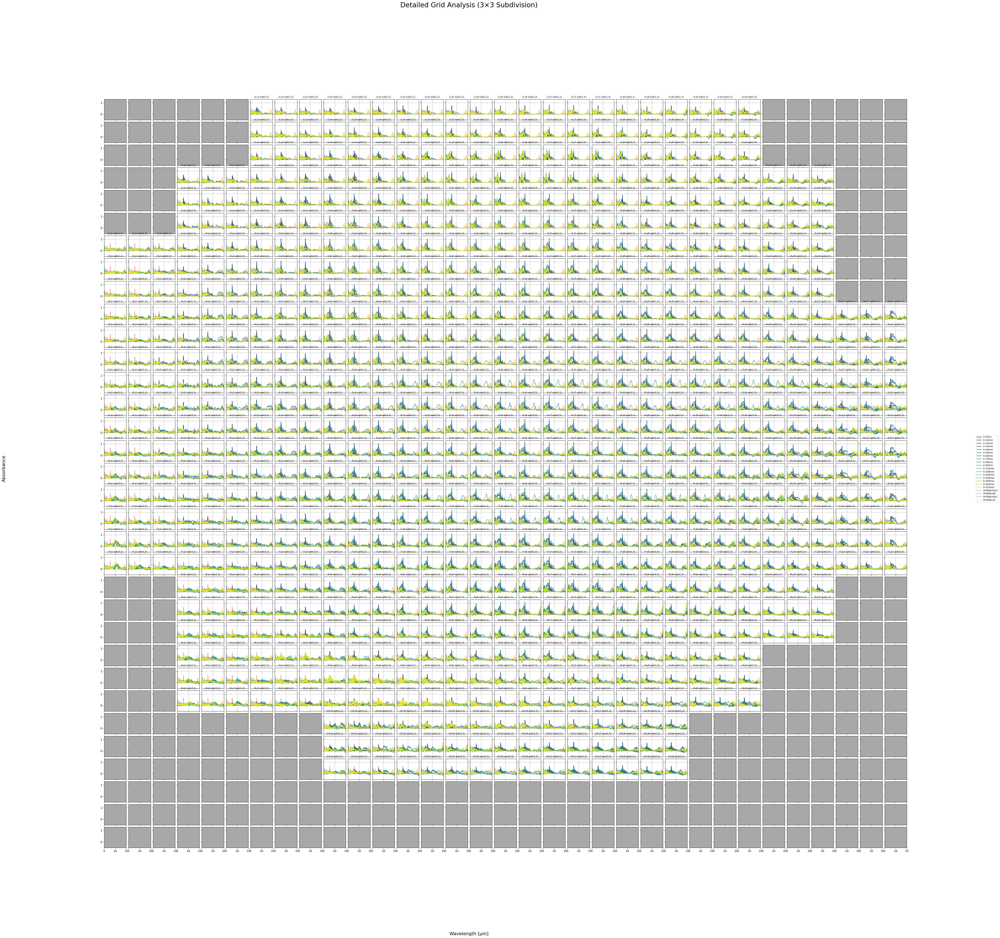

In [3]:
# 必要なライブラリのインポート
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
from scipy import interpolate

# HITRANデータベースからの分子スペクトルデータの読み込みと数値変換
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# 文字列データを数値データに変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルのパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定
selected_times = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 120, 180, 240, 300, 360, 420, 510]
selected_time_points = ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144', '1214', '1314', '1414', '1514', '1614', '1714', '1837']

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000
nw = len(yw)

# 空間分解能の設定
xst,yst = 150,130
xbin,ybin,sbin = 11,11,28
x0 = np.arange(xst,xst+xbin*sbin,sbin)
y0 = np.arange(yst,yst+ybin*sbin,sbin)

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304,264,154

# 時間発展を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_times)))

# 3×3サブグリッド解析のための設定
sub_divisions = 3
sub_bin = sbin // sub_divisions

# サブグリッド解析用の新しいプロット設定
fig_detailed, ax_detailed = plt.subplots(ybin*sub_divisions, xbin*sub_divisions, 
                                       sharex=True, sharey=True, 
                                       figsize=(48, 48))
plt.subplots_adjust(hspace=0.1, wspace=0.1)

# メインの解析ループを拡張
for i in range(ybin):
    for j in range(xbin):
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix>r_cir:
            for sub_i in range(sub_divisions):
                for sub_j in range(sub_divisions):
                    plot_i = i * sub_divisions + sub_i
                    plot_j = j * sub_divisions + sub_j
                    ax_detailed[plot_i, plot_j].set_facecolor('darkgray')
            continue
        
        # サブグリッド解析
        for sub_i in range(sub_divisions):
            for sub_j in range(sub_divisions):
                # サブグリッドの位置計算
                sub_pix_x = pix_x + sub_j * sub_bin
                sub_pix_y = pix_y + sub_i * sub_bin
                
                # プロット位置の計算
                plot_i = i * sub_divisions + sub_i
                plot_j = j * sub_divisions + sub_j
                
                # HITRANデータのプロット
                ax_detailed[plot_i, plot_j].plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
                ax_detailed[plot_i, plot_j].plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
                ax_detailed[plot_i, plot_j].plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
                ax_detailed[plot_i, plot_j].plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
                
                # 時間発展データの処理とプロット
                for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
                    path_sam = base_path + time_point + '/'
                    
                    Zs_tg = np.load(path_sam + 'tg.npy')
                    Zs_ref = np.load(path_ref + 'ref.npy')
                    Absorb = np.log10(Zs_ref/Zs_tg)
                    
                    # サブグリッドでの平均化
                    spectrum = np.average(Absorb[:, sub_pix_y:sub_pix_y+sub_bin, 
                                              sub_pix_x:sub_pix_x+sub_bin], axis=(1,2))
                    baseline = rolling_ball_baseline(spectrum)
                    corrected_spectrum = spectrum - baseline
                    
                    ax_detailed[plot_i, plot_j].plot(yw, corrected_spectrum, 
                                                    color=colors[t_idx], alpha=0.7)
                
                # グラフ設定
                ax_detailed[plot_i, plot_j].set_xlim([5, 15])
                ax_detailed[plot_i, plot_j].set_ylim([-0.5, 1.3])
                ax_detailed[plot_i, plot_j].grid(True)
                ax_detailed[plot_i, plot_j].set_title(f'i{i+1}-j{j+1} sub({sub_i+1},{sub_j+1})', 
                                                     fontsize=8)

# 凡例の設定
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min') 
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N2O', alpha=0.4),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO2', alpha=0.4),
    plt.Line2D([0], [0], color='orange', label='HITRAN O3', alpha=0.4)
]

# 凡例を図の右側に配置
fig_detailed.legend(handles=time_legend + hitran_legend, 
                   loc='center left', 
                   bbox_to_anchor=(1.02, 0.5),
                   fontsize=8)

# 軸ラベルとタイトルの設定
fig_detailed.text(0.5, 0.02, 'Wavelength [μm]', ha='center', fontsize=16)
fig_detailed.text(0.02, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=16)
fig_detailed.suptitle('Detailed Grid Analysis (3×3 Subdivision)', fontsize=24)

# 右側に凡例を表示するためのスペース確保
plt.subplots_adjust(right=0.95)

plt.show()


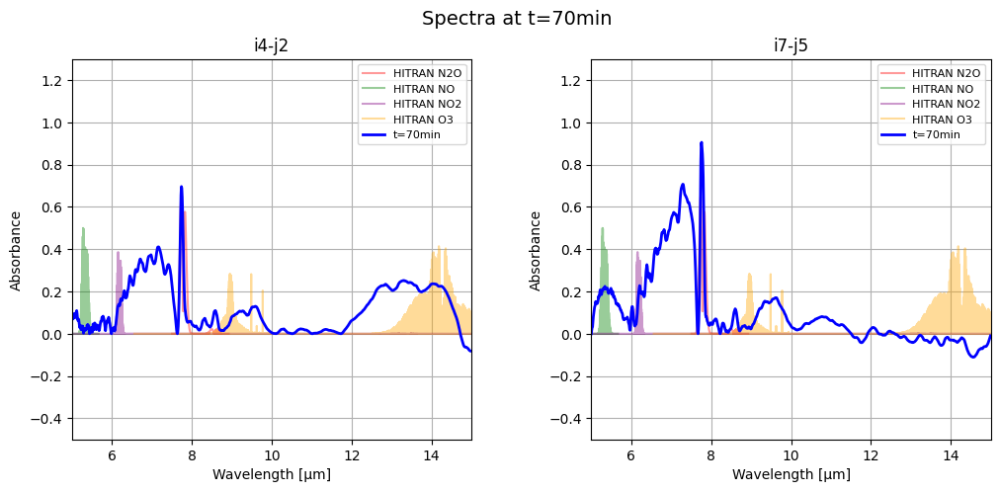

In [8]:
# 必要なライブラリのインポート
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
from scipy import interpolate

# HITRANデータベースの読み込み
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# 数値データへの変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正関数
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000

# 空間パラメータの設定
xst,yst = 150,130
xbin,ybin,sbin = 11,11,28
x0 = np.arange(xst,xst+xbin*sbin,sbin)
y0 = np.arange(yst,yst+ybin*sbin,sbin)

# プロット設定
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
plt.subplots_adjust(wspace=0.3)

# 表示するグリッドポイントと時間
grid_points = [(4, 2), (7, 5)]  # i4-j2とi7-j5に対応する正しい座標
titles = ['i4-j2', 'i7-j5']
time_point = '1124'  # 70分のデータ

for ax, (i, j), title in zip([ax1, ax2], grid_points, titles):
    pix_x, pix_y = x0[j], y0[i]
    
    # HITRANデータのプロット
    ax.plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4, label='HITRAN N2O')
    ax.plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4, label='HITRAN NO')
    ax.plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4, label='HITRAN NO2')
    ax.plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4, label='HITRAN O3')
    
    # 70分のデータ処理とプロット
    path_sam = base_path + time_point + '/'
    Zs_tg = np.load(path_sam + 'tg.npy')
    Zs_ref = np.load(path_ref + 'ref.npy')
    Absorb = np.log10(Zs_ref/Zs_tg)
    
    spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
    baseline = rolling_ball_baseline(spectrum)
    corrected_spectrum = spectrum - baseline
    
    ax.plot(yw, corrected_spectrum, color='blue', label='t=70min', linewidth=2)
    
    # グラフ設定
    ax.set_xlim([5, 15])
    ax.set_ylim([-0.5, 1.3])
    ax.grid(True)
    ax.set_title(title)
    ax.set_xlabel('Wavelength [μm]')
    ax.set_ylabel('Absorbance')
    ax.legend(fontsize=8)

plt.suptitle('Spectra at t=70min', fontsize=14)
plt.show()


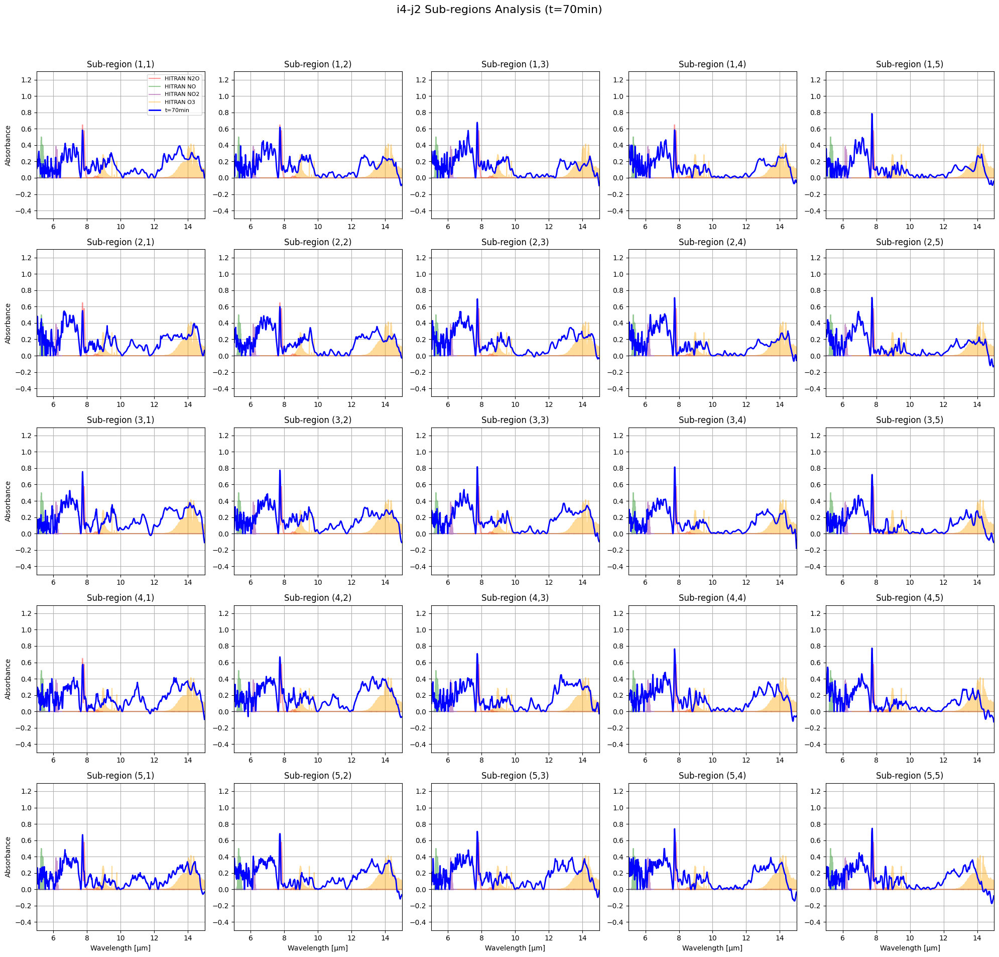

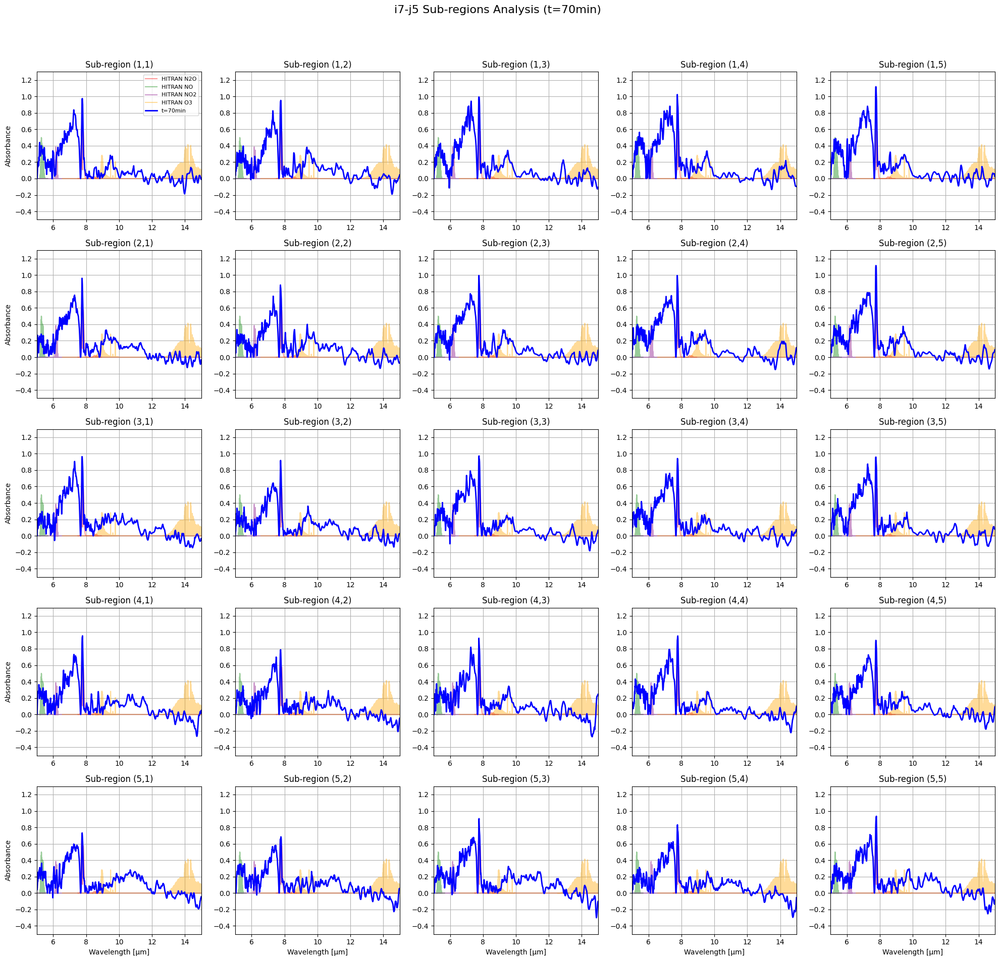

In [1]:
# 必要なライブラリのインポート
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
from scipy import interpolate

# HITRANデータベースの読み込み
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# 数値データへの変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正関数
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000

# 空間パラメータの設定
xst,yst = 150,130
xbin,ybin,sbin = 11,11,28
x0 = np.arange(xst,xst+xbin*sbin,sbin)
y0 = np.arange(yst,yst+ybin*sbin,sbin)

# 5×5のサブプロット作成（i4-j2用とi7-j5用の2つの図）
fig1, axes1 = plt.subplots(5, 5, figsize=(20, 20))
fig2, axes2 = plt.subplots(5, 5, figsize=(20, 20))
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# 分析する位置の設定
positions = [(4, 2), (7, 5)]
time_point = '1124'  # 70分のデータ

# 各位置でのサブ領域の分析
for pos_idx, (i, j) in enumerate(positions):
    pix_x, pix_y = x0[j], y0[i]
    
    # サブ領域のサイズ計算
    sub_size = sbin // 5
    
    # 各サブ領域の処理
    for sub_i in range(5):
        for sub_j in range(5):
            # サブ領域の座標計算
            sub_x = pix_x + sub_j * sub_size
            sub_y = pix_y + sub_i * sub_size
            
            # 現在のaxes選択
            current_ax = axes1[sub_i, sub_j] if pos_idx == 0 else axes2[sub_i, sub_j]
            
            # HITRANデータのプロット
            current_ax.plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4, label='HITRAN N2O')
            current_ax.plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4, label='HITRAN NO')
            current_ax.plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4, label='HITRAN NO2')
            current_ax.plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4, label='HITRAN O3')
            
            # 実験データの処理とプロット
            path_sam = base_path + time_point + '/'
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            
            # サブ領域のスペクトル計算
            spectrum = np.average(Absorb[:, sub_y:sub_y+sub_size, sub_x:sub_x+sub_size], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            current_ax.plot(yw, corrected_spectrum, color='blue', label='t=70min', linewidth=2)
            
            # グラフ設定
            current_ax.set_xlim([5, 15])
            current_ax.set_ylim([-0.5, 1.3])
            current_ax.grid(True)
            current_ax.set_title(f'Sub-region ({sub_i+1},{sub_j+1})')
            
            # 軸ラベルと凡例の設定
            if sub_i == 4:
                current_ax.set_xlabel('Wavelength [μm]')
            if sub_j == 0:
                current_ax.set_ylabel('Absorbance')
            if sub_i == 0 and sub_j == 0:
                current_ax.legend(fontsize=8)

# 全体のタイトル設定
fig1.suptitle('i4-j2 Sub-regions Analysis (t=70min)', fontsize=16)
fig2.suptitle('i7-j5 Sub-regions Analysis (t=70min)', fontsize=16)

# グラフ間の余白調整
fig1.tight_layout(rect=[0, 0.03, 1, 0.95])
fig2.tight_layout(rect=[0, 0.03, 1, 0.95])

# グラフの表示
plt.show()


In [ ]:
# 必要なライブラリのインポート
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import numpy as np
import pandas as pd
import scipy as scp
import matplotlib.pyplot as plt
from scipy import interpolate

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# ファイルパスの設定
gas_ref_path = "C:/Users/daiki/sokendai/N2O/experiment data/302.4K/ref/ref.npy"
gas_tg_path = "C:/Users/daiki/sokendai/N2O/experiment data/302.4K/5/tg.npy"
solid_ref_path = "C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/ref/ref.npy"
solid_tg_path = "C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/1413/tg.npy"

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000
nw = len(yw)

# 空間分解能の設定
xst,yst = 150,130
xbin,ybin,sbin = 11,11,28
x0 = np.arange(xst,xst+xbin*sbin,sbin)
y0 = np.arange(yst,yst+ybin*sbin,sbin)

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304,264,154

# データの読み込み
gas_ref = np.load(gas_ref_path)
gas_tg = np.load(gas_tg_path)
solid_ref = np.load(solid_ref_path)
solid_tg = np.load(solid_tg_path)

# 吸光度の計算
gas_absorb = np.log10(gas_ref/gas_tg)
solid_absorb = np.log10(solid_ref/solid_tg)

# 全体マップのプロット設定
fig, ax = plt.subplots(xbin,ybin, sharex=True, sharey=True, figsize=(16,16))
plt.subplots_adjust(hspace=0.0, wspace=0.0, left=0.08, right=0.85, bottom=0.05, top=0.95)

# グリッドインデックスの表示設定
for i in range(ybin):
    fig.text(0.04, 0.95 - ((i+0.5)/11)*0.9, f'i{i+1}', fontsize=14, ha='center', va='center')
for j in range(xbin):
    x_pos = 0.08 + (0.85-0.08)*((j+0.5)/11)
    fig.text(x_pos, 0.96, f'j{j+1}', fontsize=14, ha='center', va='center')

# メインの解析ループ - 各グリッドポイントでのスペクトル解析
for i in range(ybin):
    for j in range(xbin):
        pix_x,pix_y = x0[j],y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix>r_cir:
            ax[ybin-i-1,j].set_facecolor('darkgray')
            continue
            
        # スペクトル処理とプロット
        gas_spectrum = np.average(gas_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        solid_spectrum = np.average(solid_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        
        # ベースライン補正
        gas_baseline = rolling_ball_baseline(gas_spectrum)
        solid_baseline = rolling_ball_baseline(solid_spectrum)
        
        gas_corrected = gas_spectrum - gas_baseline
        solid_corrected = solid_spectrum - solid_baseline
        
        # プロット
        ax[ybin-i-1,j].plot(yw, gas_corrected, color='blue', label='N2O gas')
        ax[ybin-i-1,j].plot(yw, solid_corrected, color='red', label='N2O solid')
        
        # グラフの表示範囲とグリッド設定
        ax[ybin-i-1,j].set_xlim([5,15])
        ax[ybin-i-1,j].set_ylim([-0.5,1.3])
        ax[ybin-i-1,j].grid()

# 軸ラベルの設定
ax[5,0].set_ylabel("Absorbance", labelpad=30)
ax[10,5].set_xlabel("Wavelength [μm]")

# 凡例の設定
legend_elements = [
    plt.Line2D([0], [0], color='blue', label='N2O gas'),
    plt.Line2D([0], [0], color='red', label='N2O solid')
]

# 凡例を図の右側に配置
fig.legend(handles=legend_elements, 
          loc='center left', 
          bbox_to_anchor=(0.88, 0.5),
          fontsize=8)

plt.show()

# 拡大表示の設定
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(12, 12))
plt.subplots_adjust(hspace=0.3, wspace=0.3)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i5, i6 (0-based indexing)
j_indices = [4, 5]  # j5, j6 (0-based indexing)

# 拡大表示の作成
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # スペクトル処理
        gas_spectrum = np.average(gas_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        solid_spectrum = np.average(solid_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        
        # ベースライン補正
        gas_baseline = rolling_ball_baseline(gas_spectrum)
        solid_baseline = rolling_ball_baseline(solid_spectrum)
        
        gas_corrected = gas_spectrum - gas_baseline
        solid_corrected = solid_spectrum - solid_baseline
        
        # プロット
        ax_zoom[idx_i, idx_j].plot(yw, gas_corrected, color='blue', label='N2O gas')
        ax_zoom[idx_i, idx_j].plot(yw, solid_corrected, color='red', label='N2O solid')
        
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.5, 1.3])
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}')

# 凡例の設定
legend_elements = [
    plt.Line2D([0], [0], color='blue', label='N2O gas'),
    plt.Line2D([0], [0], color='red', label='N2O solid')
]

# 拡大表示の凡例を右側に配置
fig_zoom.legend(handles=legend_elements, 
                loc='center left', 
                bbox_to_anchor=(0.88, 0.5),
                fontsize=8)

# 軸ラベルとタイトルの設定
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center')
fig_zoom.text(0.04, 0.5, 'Absorbance', va='center', rotation='vertical')

# 右側に凡例を表示するためのスペース確保
plt.subplots_adjust(right=0.85)
plt.show()



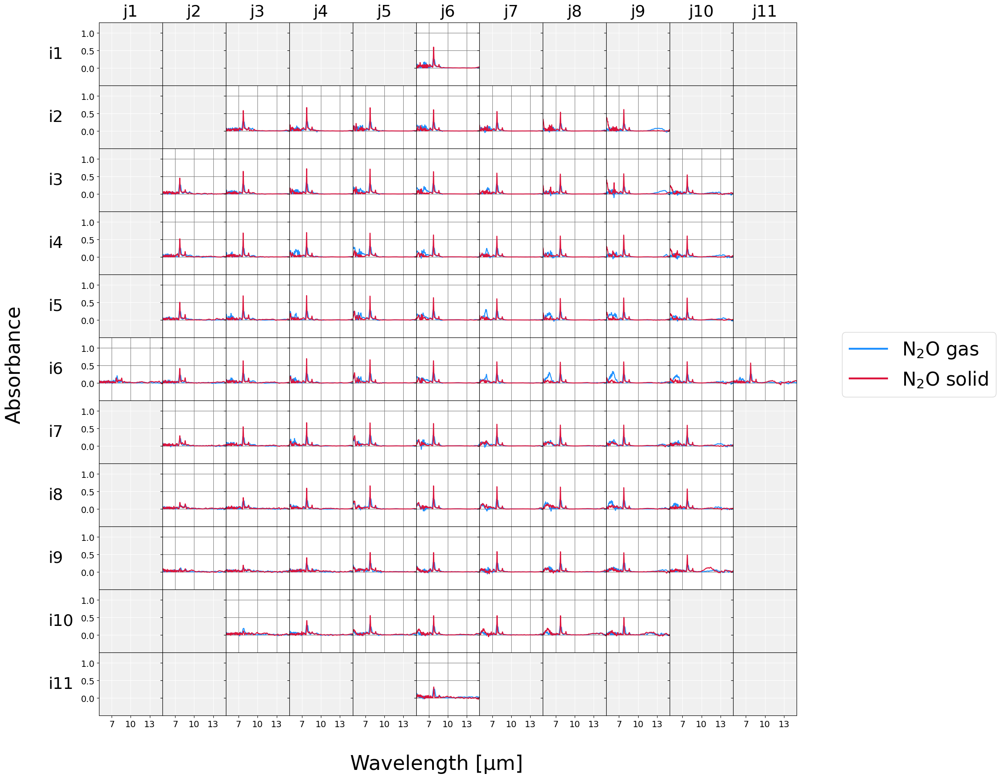

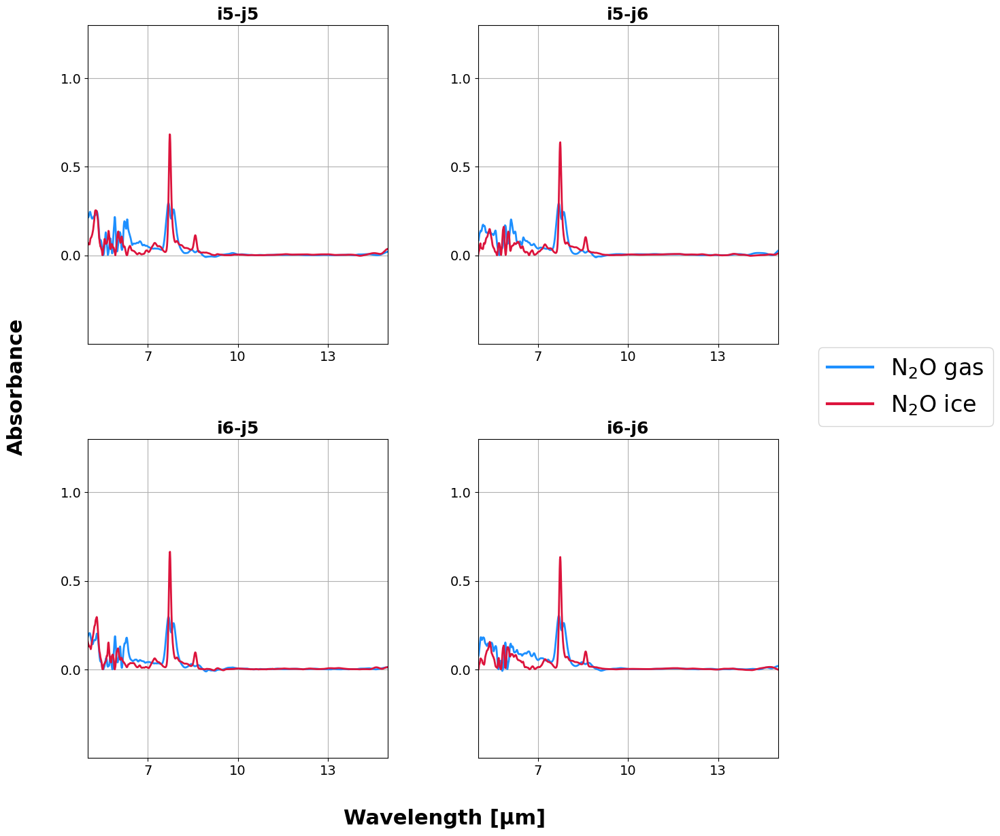

In [11]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.lines import Line2D
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# ファイルパスの設定
gas_ref_path = "C:/Users/daiki/sokendai/N2O/experiment data/302.4K/ref/ref.npy"
gas_tg_path = "C:/Users/daiki/sokendai/N2O/experiment data/302.4K/5/tg.npy"
solid_ref_path = "C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/ref/ref.npy"
solid_tg_path = "C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/1413/tg.npy"

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# データの読み込み
gas_ref = np.load(gas_ref_path)
gas_tg = np.load(gas_tg_path)
solid_ref = np.load(solid_ref_path)
solid_tg = np.load(solid_tg_path)

# 吸光度の計算
gas_absorb = np.log10(gas_ref/gas_tg)
solid_absorb = np.log10(solid_ref/solid_tg)

# 円形測定領域の設定（グリッド単位）
center_x = 5  # 中心のx座標 (0-based index)
center_y = 5  # 中心のy座標
radius = 5    # 測定領域の半径（グリッド単位）

# メインプロットの設定 - 11×11グリッド
fig, axes = plt.subplots(11, 11, figsize=(20, 20))
plt.subplots_adjust(wspace=0, hspace=0)

# カラー設定 - 明るい青と赤
gas_color = 'dodgerblue'  # 明るい青
solid_color = 'crimson'   # 明るい赤

# メインの解析ループ - 各グリッドポイントでの解析
for i in range(11):
    for j in range(11):
        ax = axes[i, j]
        pix_x, pix_y = x0[j], y0[i]
        
        # 円形測定領域の判定
        distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
        
        if distance > radius:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
            
            # スペクトル処理とプロット
            gas_spectrum = np.average(gas_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            solid_spectrum = np.average(solid_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            
            # ベースライン補正
            gas_baseline = rolling_ball_baseline(gas_spectrum)
            solid_baseline = rolling_ball_baseline(solid_spectrum)
            
            gas_corrected = gas_spectrum - gas_baseline
            solid_corrected = solid_spectrum - solid_baseline
            
            # プロット
            ax.plot(yw, gas_corrected, color=gas_color, linewidth=1.5)
            ax.plot(yw, solid_corrected, color=solid_color, linewidth=1.5)
        
        # グラフの基本設定
        ax.grid(True, color='white' if distance > radius else 'gray')
        ax.set_xlim([5, 15])
        ax.set_ylim([-0.5, 1.3])
        
        # x軸の目盛りを7, 10, 13に設定
        ax.set_xticks([7, 10, 13])
        ax.set_xticklabels(['7', '10', '13'], fontsize=14)
        
        # y軸の目盛りを設定
        ax.set_yticks([0, 0.5, 1.0])
        ax.set_yticklabels(['0.0', '0.5', '1.0'], fontsize=14)
        
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
        
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
        
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=26, pad=10)
        
        # 左側にi1-i11のラベルを表示
        if j == 0:
            ax.text(-0.8, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=26)

# 凡例の設定 - 分子種を下付き文字で表示、線を太く
legend_elements = [
    Line2D([0], [0], color=gas_color, label='N$_2$O gas', linewidth=3.0, alpha=1.0),
    Line2D([0], [0], color=solid_color, label='N$_2$O solid', linewidth=3.0, alpha=1.0)
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=legend_elements,
          loc='center left',
          bbox_to_anchor=(0.94, 0.5),
          fontsize=30)

# 全体のラベル設定
fig.text(0.5, 0.05, 'Wavelength [μm]', ha='center', fontsize=32)
fig.text(0.02, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=32)

plt.show()

# 拡大表示の設定 - 4つのグリッドポイントのみ
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i方向の表示位置
j_indices = [4, 5]  # j方向の表示位置

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # スペクトル処理
        gas_spectrum = np.average(gas_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        solid_spectrum = np.average(solid_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        
        # ベースライン補正
        gas_baseline = rolling_ball_baseline(gas_spectrum)
        solid_baseline = rolling_ball_baseline(solid_spectrum)
        
        gas_corrected = gas_spectrum - gas_baseline
        solid_corrected = solid_spectrum - solid_baseline
        
        # プロット
        ax_zoom[idx_i, idx_j].plot(yw, gas_corrected, color=gas_color, linewidth=2.0)
        ax_zoom[idx_i, idx_j].plot(yw, solid_corrected, color=solid_color, linewidth=2.0)
        
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.5, 1.3])
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
        ax_zoom[idx_i, idx_j].tick_params(labelsize=14)
        # 拡大表示でも同じ目盛りを使用
        ax_zoom[idx_i, idx_j].set_xticks([7, 10, 13])
        ax_zoom[idx_i, idx_j].set_xticklabels(['7', '10', '13'])
        ax_zoom[idx_i, idx_j].set_yticks([0, 0.5, 1.0])
        ax_zoom[idx_i, idx_j].set_yticklabels(['0.0', '0.5', '1.0'])

# 凡例の設定 - 分子種を下付き文字で表示
legend_elements = [
    Line2D([0], [0], color=gas_color, label='N$_2$O gas', linewidth=3.0, alpha=1.0),
    Line2D([0], [0], color=solid_color, label='N$_2$O ice', linewidth=3.0, alpha=1.0)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=legend_elements,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()




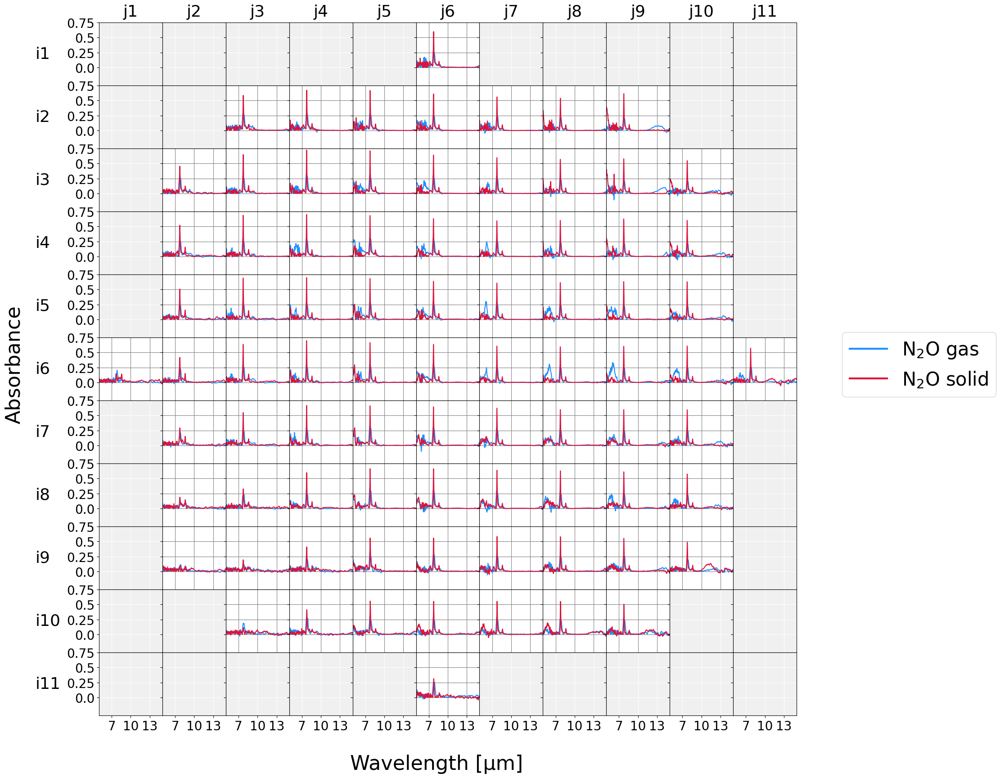

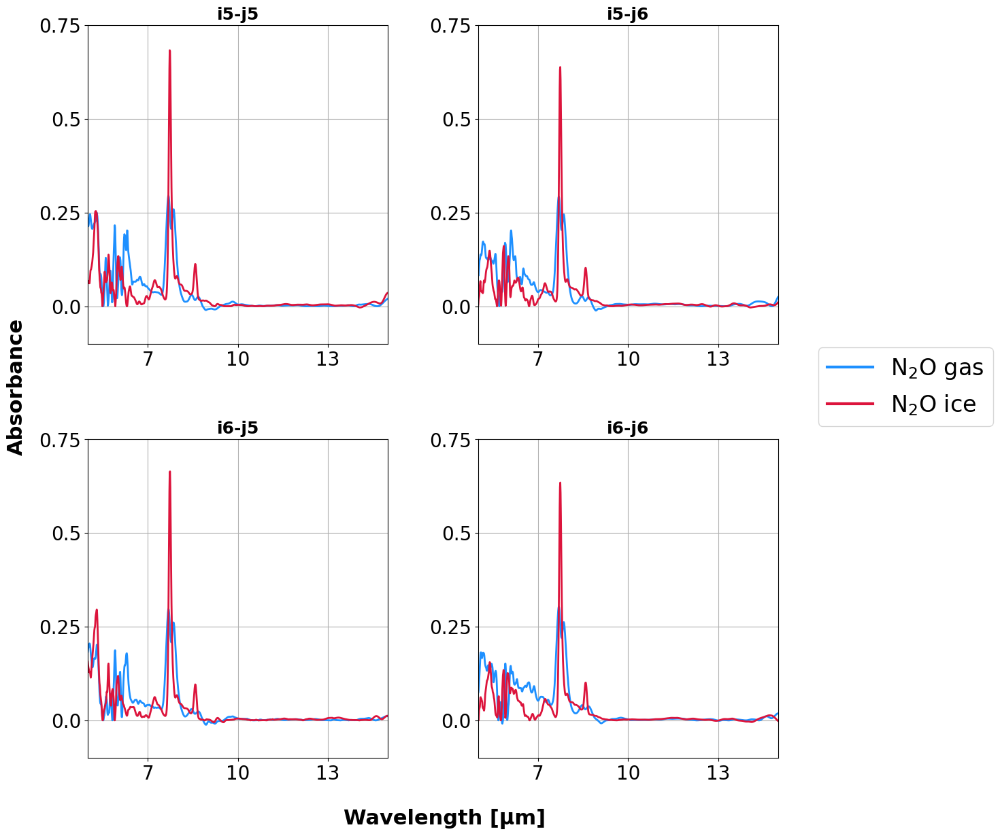

In [6]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.lines import Line2D
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate

# フォントサイズの設定を大きくする
rcParams['font.size'] = 18
rcParams['axes.labelsize'] = 20
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 18
rcParams['ytick.labelsize'] = 18
rcParams['legend.fontsize'] = 18
rcParams['figure.titlesize'] = 22

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# ファイルパスの設定
gas_ref_path = "C:/Users/daiki/sokendai/N2O/experiment data/302.4K/ref/ref.npy"
gas_tg_path = "C:/Users/daiki/sokendai/N2O/experiment data/302.4K/5/tg.npy"
solid_ref_path = "C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/ref/ref.npy"
solid_tg_path = "C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/1413/tg.npy"

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# データの読み込み
gas_ref = np.load(gas_ref_path)
gas_tg = np.load(gas_tg_path)
solid_ref = np.load(solid_ref_path)
solid_tg = np.load(solid_tg_path)

# 吸光度の計算
gas_absorb = np.log10(gas_ref/gas_tg)
solid_absorb = np.log10(solid_ref/solid_tg)

# 円形測定領域の設定（グリッド単位）
center_x = 5  # 中心のx座標 (0-based index)
center_y = 5  # 中心のy座標
radius = 5    # 測定領域の半径（グリッド単位）

# メインプロットの設定 - 11×11グリッド
fig, axes = plt.subplots(11, 11, figsize=(20, 20))
plt.subplots_adjust(wspace=0, hspace=0)

# カラー設定 - 明るい青と赤
gas_color = 'dodgerblue'  # 明るい青
solid_color = 'crimson'   # 明るい赤

# メインの解析ループ - 各グリッドポイントでの解析
for i in range(11):
    for j in range(11):
        ax = axes[i, j]
        pix_x, pix_y = x0[j], y0[i]
        
        # 円形測定領域の判定
        distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
        
        if distance > radius:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
            
            # スペクトル処理とプロット
            gas_spectrum = np.average(gas_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            solid_spectrum = np.average(solid_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            
            # ベースライン補正
            gas_baseline = rolling_ball_baseline(gas_spectrum)
            solid_baseline = rolling_ball_baseline(solid_spectrum)
            
            gas_corrected = gas_spectrum - gas_baseline
            solid_corrected = solid_spectrum - solid_baseline
            
            # プロット
            ax.plot(yw, gas_corrected, color=gas_color, linewidth=1.5)
            ax.plot(yw, solid_corrected, color=solid_color, linewidth=1.5)
        
        # グラフの基本設定
        ax.grid(True, color='white' if distance > radius else 'gray')
        ax.set_xlim([5, 15])
        ax.set_ylim([-0.3, 0.75])  # 縦軸範囲を変更
        
        # x軸の目盛りを7, 10, 13に設定
        ax.set_xticks([7, 10, 13])
        ax.set_xticklabels(['7', '10', '13'], fontsize=20)  # フォントサイズを大きく
        
        # y軸の目盛りを設定
        ax.set_yticks([0, 0.25, 0.5, 0.75])
        ax.set_yticklabels(['0.0', '0.25', '0.5', '0.75'], fontsize=20)  # フォントサイズを大きく
        
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
        
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
        
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=26, pad=10)
        
        # 左側にi1-i11のラベルを表示（位置を左に移動）
        if j == 0:
            ax.text(-1.0, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=26)

# 凡例の設定 - 分子種を下付き文字で表示、線を太く
legend_elements = [
    Line2D([0], [0], color=gas_color, label='N$_2$O gas', linewidth=3.0, alpha=1.0),
    Line2D([0], [0], color=solid_color, label='N$_2$O solid', linewidth=3.0, alpha=1.0)
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=legend_elements,
          loc='center left',
          bbox_to_anchor=(0.94, 0.5),
          fontsize=30)

# 全体のラベル設定
fig.text(0.5, 0.05, 'Wavelength [μm]', ha='center', fontsize=32)
fig.text(0.02, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=32)

plt.show()

# 拡大表示の設定 - 4つのグリッドポイントのみ
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i方向の表示位置
j_indices = [4, 5]  # j方向の表示位置

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # スペクトル処理
        gas_spectrum = np.average(gas_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        solid_spectrum = np.average(solid_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        
        # ベースライン補正
        gas_baseline = rolling_ball_baseline(gas_spectrum)
        solid_baseline = rolling_ball_baseline(solid_spectrum)
        
        gas_corrected = gas_spectrum - gas_baseline
        solid_corrected = solid_spectrum - solid_baseline
        
        # プロット
        ax_zoom[idx_i, idx_j].plot(yw, gas_corrected, color=gas_color, linewidth=2.0)
        ax_zoom[idx_i, idx_j].plot(yw, solid_corrected, color=solid_color, linewidth=2.0)
        
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.1, 0.75])  # 縦軸範囲を変更
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
        ax_zoom[idx_i, idx_j].tick_params(labelsize=20)  # フォントサイズを大きく
        # 拡大表示でも同じ目盛りを使用
        ax_zoom[idx_i, idx_j].set_xticks([7, 10, 13])
        ax_zoom[idx_i, idx_j].set_xticklabels(['7', '10', '13'], fontsize=20)  # フォントサイズを大きく
        ax_zoom[idx_i, idx_j].set_yticks([0, 0.25, 0.5, 0.75])
        ax_zoom[idx_i, idx_j].set_yticklabels(['0.0', '0.25', '0.5', '0.75'], fontsize=20)  # フォントサイズを大きく

# 凡例の設定 - 分子種を下付き文字で表示
legend_elements = [
    Line2D([0], [0], color=gas_color, label='N$_2$O gas', linewidth=3.0, alpha=1.0),
    Line2D([0], [0], color=solid_color, label='N$_2$O ice', linewidth=3.0, alpha=1.0)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=legend_elements,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()



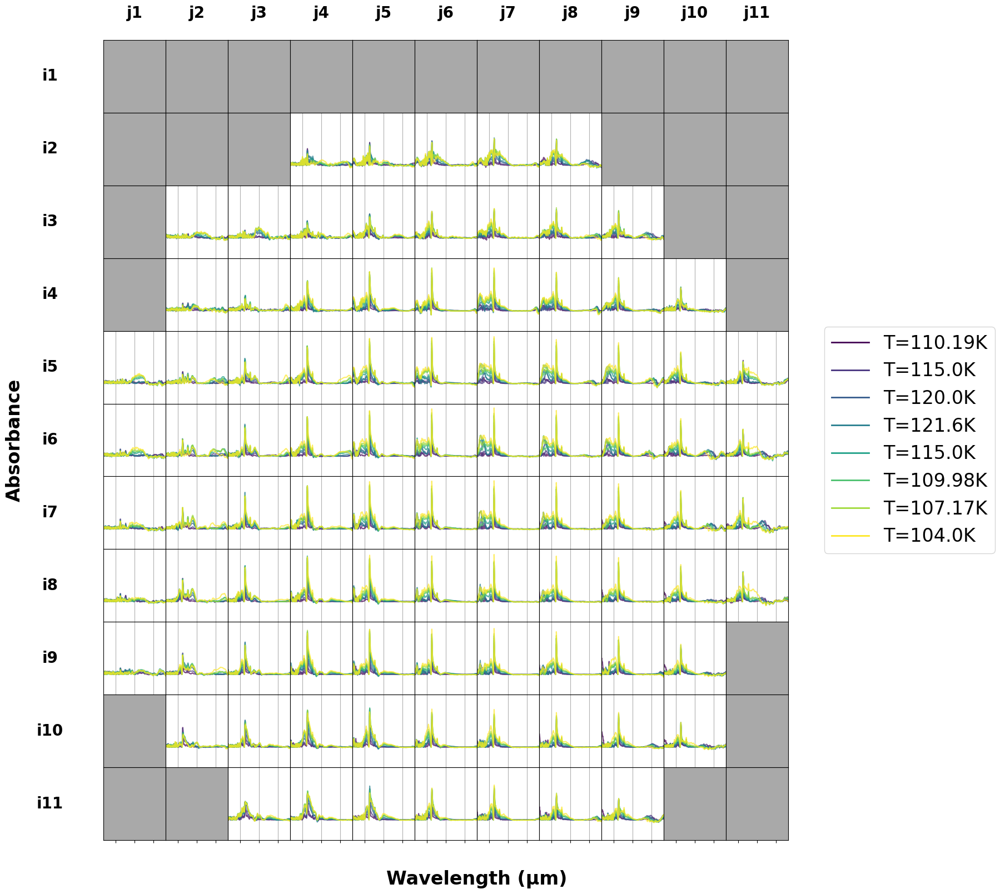

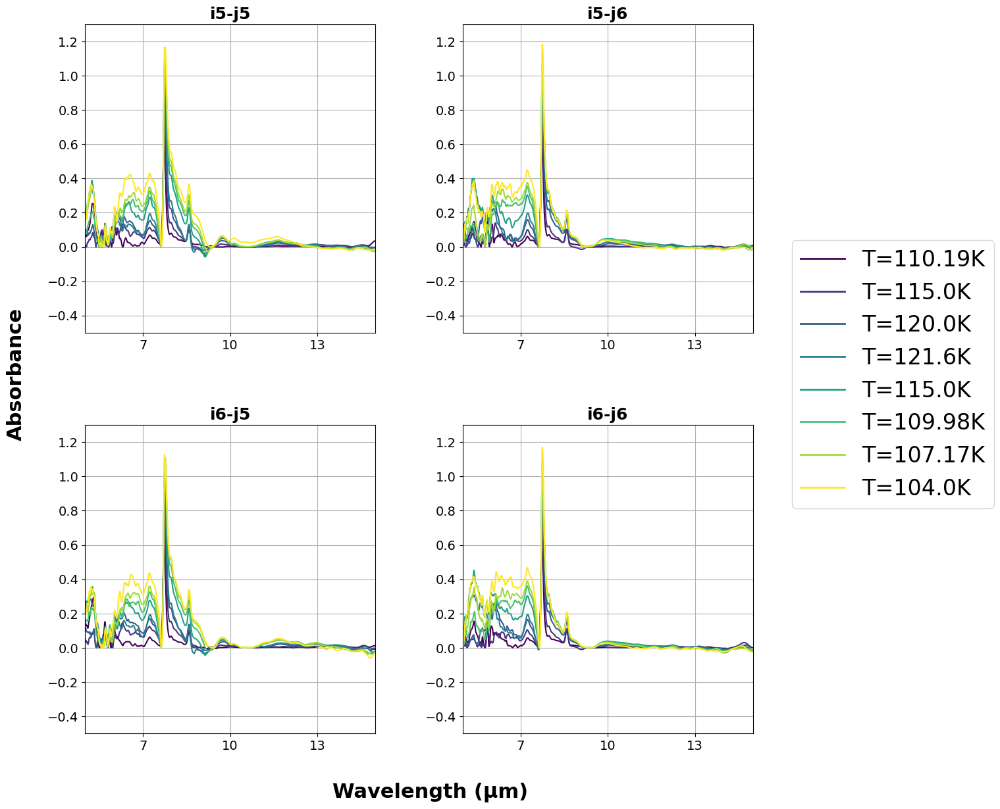

In [6]:
# 必要なライブラリのインポート - データ処理と可視化のための基本ライブラリ
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルのパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
path_ref = base_path + 'ref/'

# 時間点と温度の設定 - アニーリング過程の各時点での温度
selected_time_points = ['1413', '1423', '1432', '1440', '1445', '1449', '1453', '1513']
selected_temperature = [110.19, 115.00, 120.00, 121.6, 115.00, 109.98, 107.17, 104.00]

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)  # ナノメートル単位
yw = yw_nm / 1000  # マイクロメートル単位に変換
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 温度変化を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_time_points)))

# メインプロットの設定 - 11×11グリッド
fig, ax = plt.subplots(xbin, ybin, sharex=True, sharey=True, figsize=(16, 16))
plt.subplots_adjust(hspace=0.0, wspace=0.0, left=0.08, right=0.85, bottom=0.05, top=0.95)

# グリッドインデックスラベルの設定 - 文字サイズを大きく
for i in range(ybin):
    fig.text(0.02, 0.95 - ((i+0.5)/11)*0.9, f'i{i+1}', fontsize=20, ha='center', va='center', weight='bold')
for j in range(xbin):
    x_pos = 0.08 + (0.77)*((j+0.5)/11)
    # j1~j11の位置を上に移動
    fig.text(x_pos, 0.98, f'j{j+1}', fontsize=20, ha='center', va='center', weight='bold')

# メインの解析ループ - 各グリッドポイントでのスペクトル解析
for i in range(ybin):
    for j in range(xbin):
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax[ybin-i-1, j].set_facecolor('darkgray')
            continue
        
        # 温度変化データの処理とプロット
        for t_idx, (temp, time_point) in enumerate(zip(selected_temperature, selected_time_points)):
            path_sam = base_path + time_point + '/'
            
            # データ読み込みと吸光度計算
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            
            # スペクトル処理
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            # 温度変化スペクトルのプロット
            ax[ybin-i-1,j].plot(yw, corrected_spectrum, color=colors[t_idx], alpha=0.7)
        
        # グラフ表示設定
        ax[ybin-i-1, j].set_xlim([5, 15])
        ax[ybin-i-1, j].set_ylim([-0.5, 1.3])
        ax[ybin-i-1, j].grid()
        
        # x軸の目盛りを7, 10, 13に変更
        ax[ybin-i-1, j].set_xticks([7, 10, 13])
        
        # x軸の目盛りラベルを表示
        if i == ybin-1:  # 一番下の行のみラベルを表示
            ax[ybin-i-1, j].set_xticklabels(['7', '10', '13'])
        else:
            ax[ybin-i-1, j].set_xticklabels(['', '', ''])  # 他の行はラベルを非表示
            
        # 左端の列のみy軸の目盛りを表示
        if j == 0:
            ax[ybin-i-1, j].set_yticks([-0.5, 0, 0.5])
        else:
            ax[ybin-i-1, j].set_yticks([])

# 軸ラベルの設定（大きいフォントサイズ）
fig.text(-0.03, 0.5, "Absorbance", va='center', rotation='vertical', fontsize=24, weight='bold')
fig.text(0.5, 0.00, "Wavelength (μm)", ha='center', fontsize=24, weight='bold')

# 凡例の設定 - 温度変化を表示
temp_legend = [
    plt.Line2D([0], [0], color=colors[i], label=f'T={temp}K', linewidth=2)
    for i, temp in enumerate(selected_temperature)
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=temp_legend,
          loc='center left',
          bbox_to_anchor=(0.88, 0.5),
          fontsize=24)

plt.show()

# 拡大表示の設定 - 4つのグリッドポイントのみ
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i方向の表示位置
j_indices = [4, 5]  # j方向の表示位置

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # 温度変化データの処理とプロット
        for t_idx, (temp, time_point) in enumerate(zip(selected_temperature, selected_time_points)):
            path_sam = base_path + time_point + '/'
            
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            ax_zoom[idx_i, idx_j].plot(yw, corrected_spectrum, color=colors[t_idx])
        
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.5, 1.3])
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
        ax_zoom[idx_i, idx_j].tick_params(labelsize=14)
        # 拡大表示でも同じ目盛りを使用
        ax_zoom[idx_i, idx_j].set_xticks([7, 10, 13])
        ax_zoom[idx_i, idx_j].set_xticklabels(['7', '10', '13'])

# 温度変化の凡例設定
temp_legend = [
    plt.Line2D([0], [0], color=colors[i], label=f'T={temp}K', linewidth=2)
    for i, temp in enumerate(selected_temperature)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=temp_legend,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength (μm)', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()


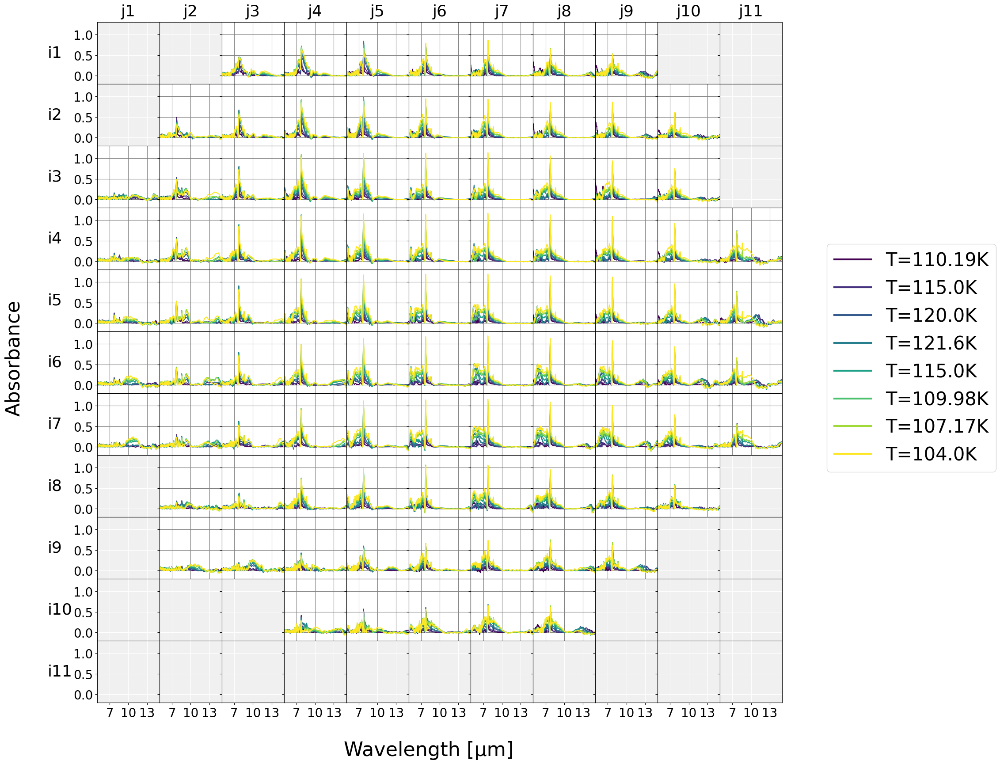

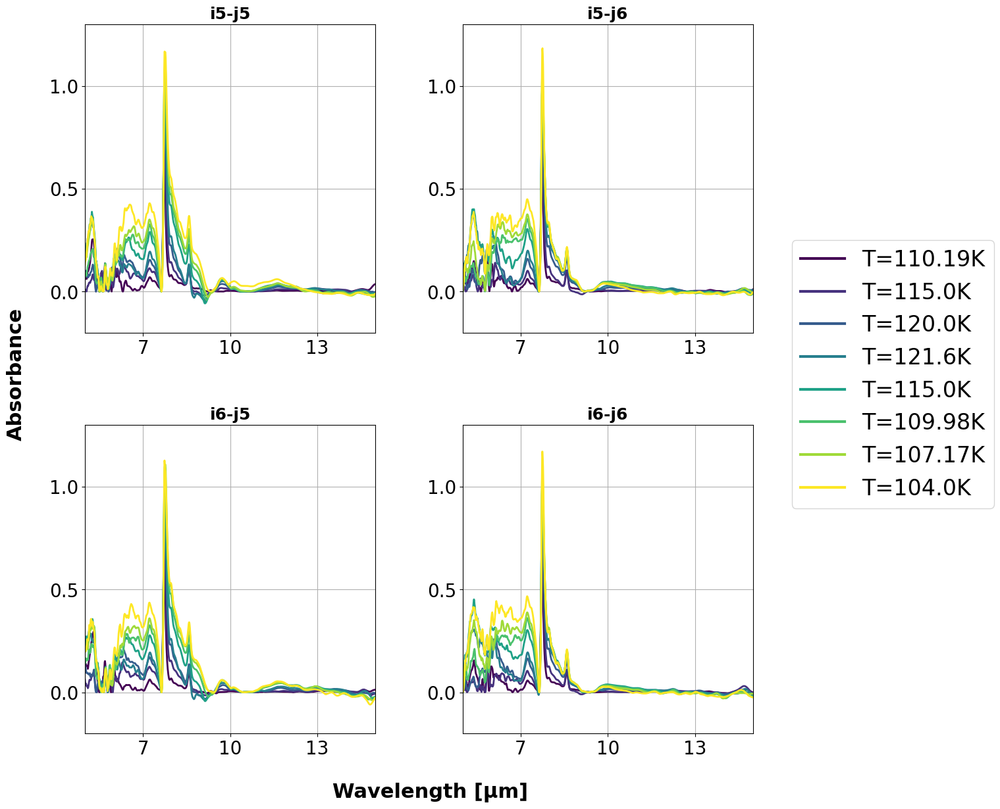

In [7]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate
from matplotlib.lines import Line2D

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 20  # 軸の数値を大きく
rcParams['ytick.labelsize'] = 20  # 軸の数値を大きく
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルのパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
path_ref = base_path + 'ref/'

# 時間点と温度の設定 - アニーリング過程の各時点での温度
selected_time_points = ['1413', '1423', '1432', '1440', '1445', '1449', '1453', '1513']
selected_temperature = [110.19, 115.00, 120.00, 121.6, 115.00, 109.98, 107.17, 104.00]

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)  # ナノメートル単位
yw = yw_nm / 1000  # マイクロメートル単位に変換
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 温度変化を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_time_points)))

# メインプロットの設定 - 11×11グリッド
fig, axes = plt.subplots(ybin, xbin, figsize=(20, 20))
plt.subplots_adjust(wspace=0, hspace=0)

# メインの解析ループ - 各グリッドポイントでのスペクトル解析
for i in range(ybin):
    for j in range(xbin):
        ax = axes[i, j]
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
            
            # 温度変化データの処理とプロット
            for t_idx, (temp, time_point) in enumerate(zip(selected_temperature, selected_time_points)):
                path_sam = base_path + time_point + '/'
                
                # データ読み込みと吸光度計算
                Zs_tg = np.load(path_sam + 'tg.npy')
                Zs_ref = np.load(path_ref + 'ref.npy')
                Absorb = np.log10(Zs_ref/Zs_tg)
                
                # スペクトル処理
                spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
                baseline = rolling_ball_baseline(spectrum)
                corrected_spectrum = spectrum - baseline
                
                # 温度変化スペクトルのプロット
                ax.plot(yw, corrected_spectrum, color=colors[t_idx], linewidth=1.5)
        
        # グラフの基本設定
        ax.grid(True, color='white' if Lpix > r_cir else 'gray')
        ax.set_xlim([5, 15])
        ax.set_ylim([-0.2, 1.3])
        
        # x軸の目盛りを7, 10, 13に設定
        ax.set_xticks([7, 10, 13])
        ax.set_xticklabels(['7', '10', '13'], fontsize=20)  # フォントサイズを大きく
        
        # y軸の目盛りを設定
        ax.set_yticks([0, 0.5, 1.0])
        ax.set_yticklabels(['0.0', '0.5', '1.0'], fontsize=20)  # フォントサイズを大きく
        
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
        
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
        
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=26, pad=10)
        
        # 左側にi1-i11のラベルを表示
        if j == 0:
            ax.text(-0.8, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=26)

# 凡例の設定 - 温度変化を表示
legend_elements = [
    Line2D([0], [0], color=colors[i], label=f'T={temp}K', linewidth=3.0, alpha=1.0)
    for i, temp in enumerate(selected_temperature)
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=legend_elements,
          loc='center left',
          bbox_to_anchor=(0.94, 0.5),
          fontsize=30)

# 全体のラベル設定
fig.text(0.5, 0.05, 'Wavelength [μm]', ha='center', fontsize=32)
fig.text(0.02, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=32)

plt.show()

# 拡大表示の設定 - 4つのグリッドポイントのみ
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i方向の表示位置
j_indices = [4, 5]  # j方向の表示位置

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # 温度変化データの処理とプロット
        for t_idx, (temp, time_point) in enumerate(zip(selected_temperature, selected_time_points)):
            path_sam = base_path + time_point + '/'
            
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            ax_zoom[idx_i, idx_j].plot(yw, corrected_spectrum, color=colors[t_idx], linewidth=2.0)
        
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.2, 1.3])
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
        ax_zoom[idx_i, idx_j].tick_params(labelsize=20)  # 軸の数値を大きく
        # 拡大表示でも同じ目盛りを使用
        ax_zoom[idx_i, idx_j].set_xticks([7, 10, 13])
        ax_zoom[idx_i, idx_j].set_xticklabels(['7', '10', '13'])
        ax_zoom[idx_i, idx_j].set_yticks([0, 0.5, 1.0])
        ax_zoom[idx_i, idx_j].set_yticklabels(['0.0', '0.5', '1.0'])

# 温度変化の凡例設定
legend_elements = [
    Line2D([0], [0], color=colors[i], label=f'T={temp}K', linewidth=3.0, alpha=1.0)
    for i, temp in enumerate(selected_temperature)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=legend_elements,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()


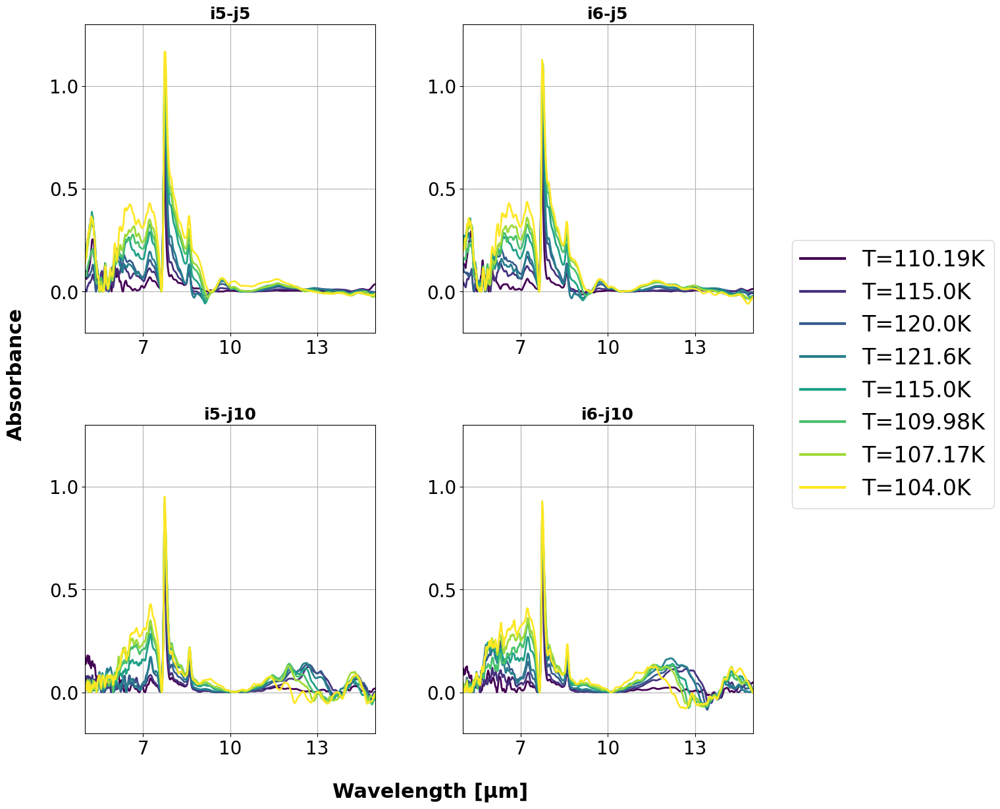

In [8]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate
from matplotlib.lines import Line2D

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 20  # 軸の数値を大きく
rcParams['ytick.labelsize'] = 20  # 軸の数値を大きく
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルのパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
path_ref = base_path + 'ref/'

# 時間点と温度の設定 - アニーリング過程の各時点での温度
selected_time_points = ['1413', '1423', '1432', '1440', '1445', '1449', '1453', '1513']
selected_temperature = [110.19, 115.00, 120.00, 121.6, 115.00, 109.98, 107.17, 104.00]

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)  # ナノメートル単位
yw = yw_nm / 1000  # マイクロメートル単位に変換
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 温度変化を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_time_points)))

# 拡大表示の設定 - 指定された4つのグリッドポイント
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定 (i, j) - 0ベースのインデックス
zoom_positions = [
    (4, 4),  # i5-j5 (0ベースで4,4)
    (5, 4),  # i6-j5 (0ベースで5,4)
    (4, 9),  # i5-j10 (0ベースで4,9)
    (5, 9)   # i6-j10 (0ベースで5,9)
]

# サブプロットの位置 (2x2グリッド)
subplot_positions = [(0, 0), (0, 1), (1, 0), (1, 1)]

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx, ((i, j), (row, col)) in enumerate(zip(zoom_positions, subplot_positions)):
    pix_x, pix_y = x0[j], y0[i]
    
    # 温度変化データの処理とプロット
    for t_idx, (temp, time_point) in enumerate(zip(selected_temperature, selected_time_points)):
        path_sam = base_path + time_point + '/'
        
        Zs_tg = np.load(path_sam + 'tg.npy')
        Zs_ref = np.load(path_ref + 'ref.npy')
        Absorb = np.log10(Zs_ref/Zs_tg)
        
        spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        baseline = rolling_ball_baseline(spectrum)
        corrected_spectrum = spectrum - baseline
        
        ax_zoom[row, col].plot(yw, corrected_spectrum, color=colors[t_idx], linewidth=2.0)
    
    # グラフの表示設定
    ax_zoom[row, col].set_xlim([5, 15])
    ax_zoom[row, col].set_ylim([-0.2, 1.3])
    ax_zoom[row, col].grid(True)
    ax_zoom[row, col].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
    ax_zoom[row, col].tick_params(labelsize=20)  # 軸の数値を大きく
    
    # 拡大表示でも同じ目盛りを使用
    ax_zoom[row, col].set_xticks([7, 10, 13])
    ax_zoom[row, col].set_xticklabels(['7', '10', '13'])
    ax_zoom[row, col].set_yticks([0, 0.5, 1.0])
    ax_zoom[row, col].set_yticklabels(['0.0', '0.5', '1.0'])

# 温度変化の凡例設定
legend_elements = [
    Line2D([0], [0], color=colors[i], label=f'T={temp}K', linewidth=3.0, alpha=1.0)
    for i, temp in enumerate(selected_temperature)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=legend_elements,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()


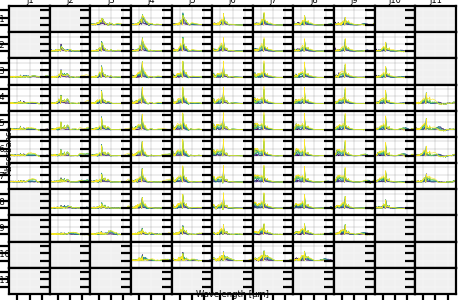

In [2]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate
from matplotlib.lines import Line2D

# フォントサイズの設定を小さくする（小さい画像サイズに合わせて）
rcParams['font.size'] = 2
rcParams['axes.labelsize'] = 2
rcParams['axes.titlesize'] = 2
rcParams['xtick.labelsize'] = 2
rcParams['ytick.labelsize'] = 2
rcParams['legend.fontsize'] = 2
rcParams['figure.titlesize'] = 3

# ベースライン補正のための関数定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅を推定する補助関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルのパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
path_ref = base_path + 'ref/'

# 時間点と温度の設定 - アニーリング過程の各時点での温度
selected_time_points = ['1413', '1423', '1432', '1440', '1445', '1449', '1453', '1513']
selected_temperature = [110.19, 115.00, 120.00, 121.6, 115.00, 109.98, 107.17, 104.00]

# スペクトル波長範囲の設定
yw_nm = np.arange(5000,15000,10)  # ナノメートル単位
yw = yw_nm / 1000  # マイクロメートル単位に変換
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 温度変化を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_time_points)))

# メインプロットの設定 - 11×11グリッド (サイズを縦465×横300ピクセル、200dpiに設定)
fig, axes = plt.subplots(ybin, xbin, figsize=(2.325, 1.5), dpi=200)
plt.subplots_adjust(wspace=0, hspace=0, left=0.02, right=0.98, bottom=0.02, top=0.98)

# メインの解析ループ - 各グリッドポイントでのスペクトル解析
for i in range(ybin):
    for j in range(xbin):
        ax = axes[i, j]
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
       
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
           
            # 温度変化データの処理とプロット
            for t_idx, (temp, time_point) in enumerate(zip(selected_temperature, selected_time_points)):
                path_sam = base_path + time_point + '/'
               
                # データ読み込みと吸光度計算
                Zs_tg = np.load(path_sam + 'tg.npy')
                Zs_ref = np.load(path_ref + 'ref.npy')
                Absorb = np.log10(Zs_ref/Zs_tg)
               
                # スペクトル処理
                spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
                baseline = rolling_ball_baseline(spectrum)
                corrected_spectrum = spectrum - baseline
               
                # 温度変化スペクトルのプロット
                ax.plot(yw, corrected_spectrum, color=colors[t_idx], linewidth=0.2)
       
        # グラフの基本設定
        ax.grid(True, color='white' if Lpix > r_cir else 'gray', linewidth=0.1)
        ax.set_xlim([5, 15])
        ax.set_ylim([-0.5, 1.3])
       
        # x軸の目盛りを7, 10, 13に設定
        ax.set_xticks([7, 10, 13])
        ax.set_xticklabels(['7', '10', '13'], fontsize=2)
       
        # y軸の目盛りを設定
        ax.set_yticks([0, 0.5, 1.0])
        ax.set_yticklabels(['0.0', '0.5', '1.0'], fontsize=2)
       
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
       
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
       
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=3, pad=1)
       
        # 左側にi1-i11のラベルを表示
        if j == 0:
            ax.text(-0.3, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=3)

# 凡例は小さいサイズでは省略（必要に応じて別途作成）

# 全体のラベル設定（小さいサイズに合わせて調整）
fig.text(0.5, 0.01, 'Wavelength [μm]', ha='center', fontsize=3)
fig.text(0.01, 0.5, 'Absorbance', va='center', rotation='vertical', fontsize=3)

# 画像を保存（200dpiで保存）
plt.savefig('annealing_spectral_grid.png', dpi=200)
plt.close()

# 保存した画像を表示
from IPython.display import Image
Image('annealing_spectral_grid.png')


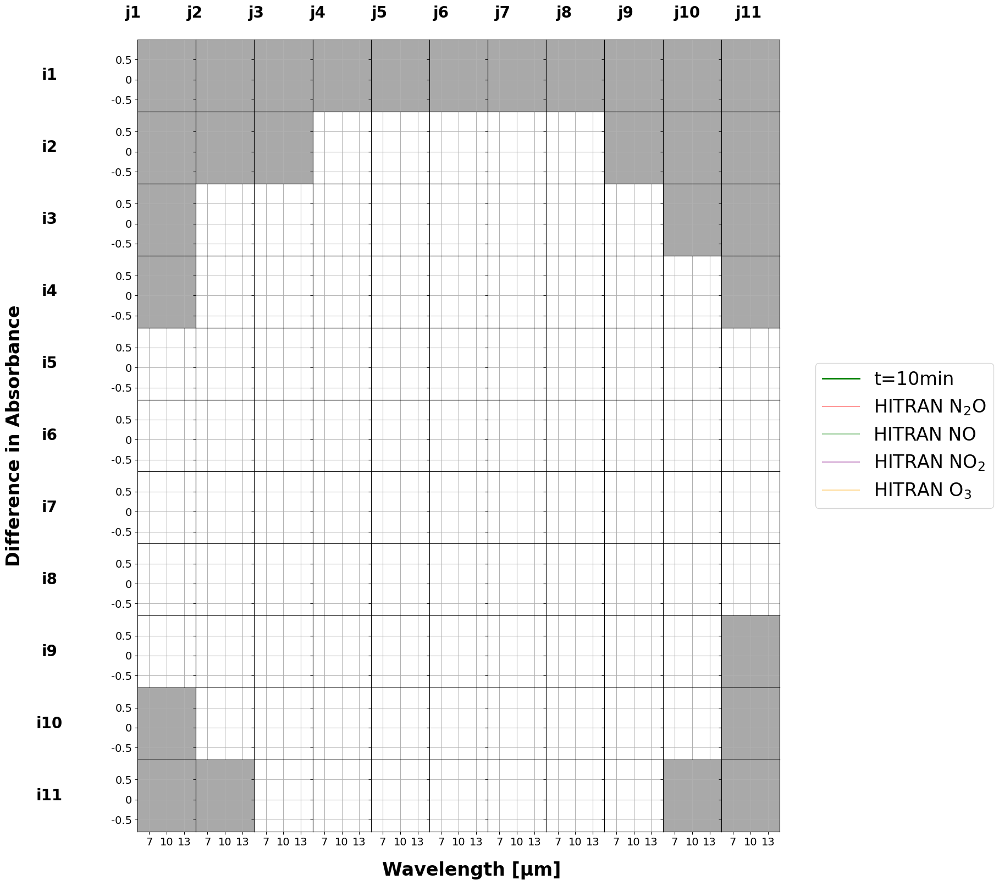

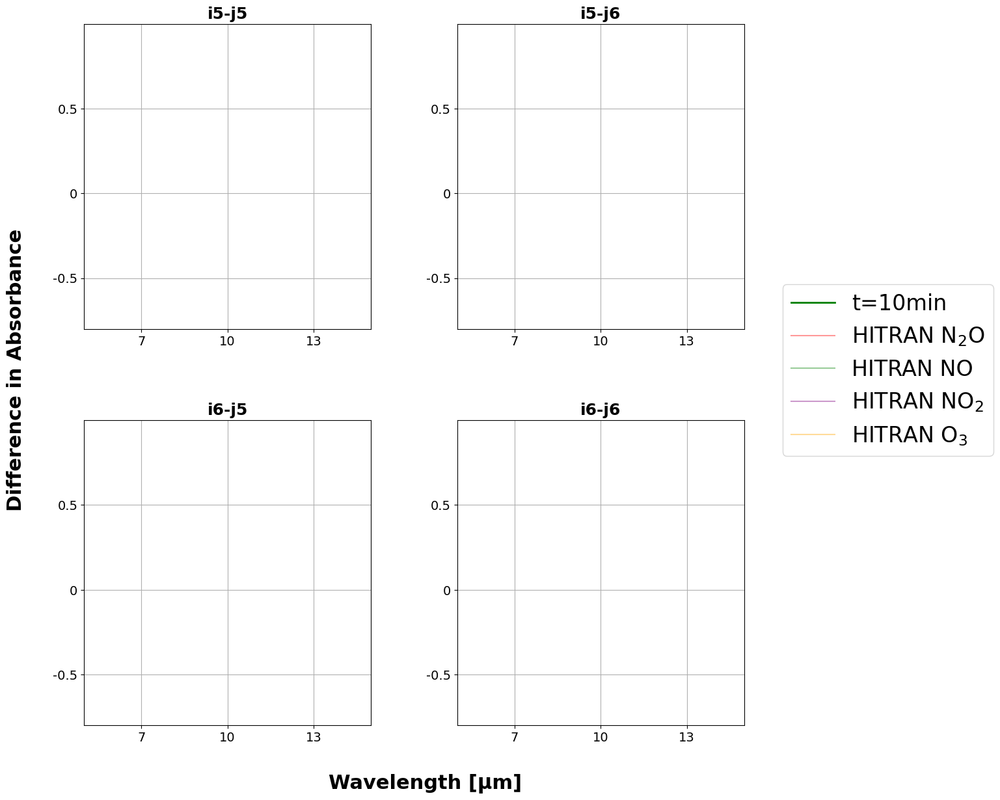

In [4]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 時間発展を表現するカラーマップの設定
colors = ['blue', 'green']  # 0分と10分の色

# メインプロットの設定 - 11×11グリッド
# shareyをFalseに変更して各行で独立したy軸を持てるようにする
fig, ax = plt.subplots(xbin, ybin, sharex=True, sharey=False, figsize=(16, 16))
plt.subplots_adjust(hspace=0.0, wspace=0.0, left=0.08, right=0.85, bottom=0.05, top=0.95)

# グリッドインデックスラベルの設定 - 文字サイズを大きく
for i in range(ybin):
    fig.text(0.02, 0.95 - ((i+0.5)/11)*0.9, f'i{i+1}', fontsize=20, ha='center', va='center', weight='bold')
for j in range(xbin):
    x_pos = 0.08 + (0.77)*((j+0.5)/11)
    # j1~j11の位置を上に移動
    fig.text(x_pos, 0.98, f'j{j+1}', fontsize=20, ha='center', va='center', weight='bold')

# メインの解析ループ - 各グリッドポイントでの空のグラフ作成
for i in range(ybin):
    for j in range(xbin):
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax[ybin-i-1, j].set_facecolor('darkgray')
        
        # グラフ表示設定
        ax[ybin-i-1, j].set_xlim([5, 15])
        ax[ybin-i-1, j].set_ylim([-0.8, 1.0])
        ax[ybin-i-1, j].grid()
        
        # x軸の目盛りを7, 10, 13に変更
        ax[ybin-i-1, j].set_xticks([7, 10, 13])
        
        # x軸の目盛りラベルを表示
        if i == ybin-1:  # 一番下の行のみラベルを表示
            ax[ybin-i-1, j].set_xticklabels(['7', '10', '13'])
        else:
            ax[ybin-i-1, j].set_xticklabels(['', '', ''])  # 他の行はラベルを非表示
        
        # y軸の目盛り設定
        ax[ybin-i-1, j].set_yticks([-0.5, 0, 0.5])
        
        # 左端の列のみy軸の目盛りラベルを表示、他の列は非表示
        if j == 0:
            # 左端の列は目盛りラベルを表示
            ax[ybin-i-1, j].set_yticklabels(['-0.5', '0', '0.5'])
            # 左端の列のy軸ラベルを明示的に表示
            for label in ax[ybin-i-1, j].get_yticklabels():
                label.set_visible(True)
        else:
            # 他の列は目盛りラベルを非表示
            ax[ybin-i-1, j].set_yticklabels([])
            # 他の列のy軸ラベルを明示的に非表示
            for label in ax[ybin-i-1, j].get_yticklabels():
                label.set_visible(False)

# 軸ラベルの設定（大きいフォントサイズ）
fig.text(-0.03, 0.5, "Difference in Absorbance", va='center', rotation='vertical', fontsize=24, weight='bold')
fig.text(0.5, 0.00, "Wavelength [μm]", ha='center', fontsize=24, weight='bold')

# 凡例の設定 - 分子種を下付き文字で表示
time_legend = [
    plt.Line2D([0], [0], color=colors[1], label='t=10min', linewidth=2)
]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N$_2$O', alpha=0.4),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO$_2$', alpha=0.4),
    plt.Line2D([0], [0], color='orange', label='HITRAN O$_3$', alpha=0.4)
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=time_legend + hitran_legend,
          loc='center left',
          bbox_to_anchor=(0.88, 0.5),
          fontsize=24)

# 左側のマージンを少し広げる
plt.subplots_adjust(left=0.12)

plt.show()

# 拡大表示の設定 - 4つのグリッドポイントのみ
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i方向の表示位置
j_indices = [4, 5]  # j方向の表示位置

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.8, 1.0])
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
        ax_zoom[idx_i, idx_j].tick_params(labelsize=14)
        # 拡大表示でも同じ目盛りを使用
        ax_zoom[idx_i, idx_j].set_xticks([7, 10, 13])
        ax_zoom[idx_i, idx_j].set_xticklabels(['7', '10', '13'])
        ax_zoom[idx_i, idx_j].set_yticks([-0.5, 0, 0.5])
        ax_zoom[idx_i, idx_j].set_yticklabels(['-0.5', '0', '0.5'])

# 時間変化とHITRANデータの凡例設定 - 分子種を下付き文字で表示
time_legend = [
    plt.Line2D([0], [0], color=colors[1], label='t=10min', linewidth=2)
]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N$_2$O', alpha=0.4),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO$_2$', alpha=0.4),
    plt.Line2D([0], [0], color='orange', label='HITRAN O$_3$', alpha=0.4)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=time_legend + hitran_legend,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Difference in Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()



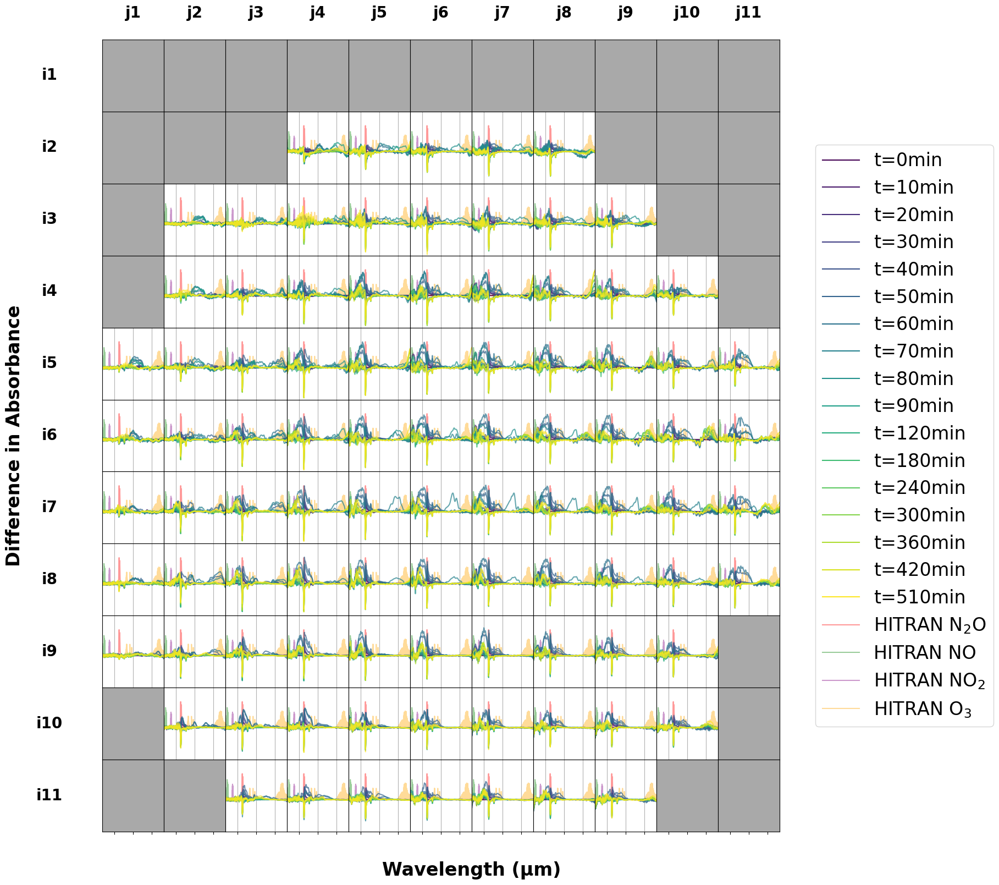

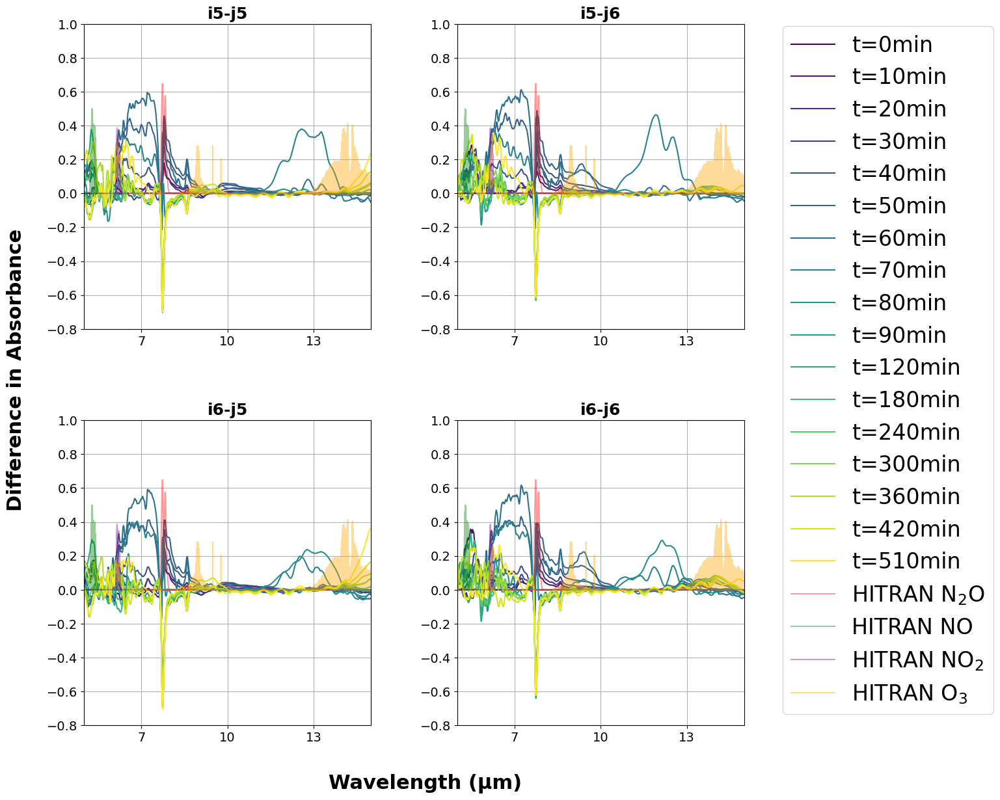

In [5]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# HITRANデータベースからの分子スペクトルデータの読み込み
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# HITRANデータの数値変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正関数の定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数の定義
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定（全時間）
selected_times = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 120, 180, 240, 300, 360, 420, 510]
selected_time_points = ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144', '1214', '1314', '1414', '1514', '1614', '1714', '1837']

# スペクトル波長範囲の設定
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 時間発展を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_times)))

# メインプロットの設定 - 11×11グリッド
fig, ax = plt.subplots(xbin, ybin, sharex=True, sharey=True, figsize=(16, 16))
plt.subplots_adjust(hspace=0.0, wspace=0.0, left=0.08, right=0.85, bottom=0.05, top=0.95)

# グリッドインデックスラベルの設定 - 文字サイズを大きく
for i in range(ybin):
    fig.text(0.02, 0.95 - ((i+0.5)/11)*0.9, f'i{i+1}', fontsize=20, ha='center', va='center', weight='bold')
for j in range(xbin):
    x_pos = 0.08 + (0.77)*((j+0.5)/11)
    # j1~j11の位置を上に移動（0.96から0.98に変更）
    fig.text(x_pos, 0.98, f'j{j+1}', fontsize=20, ha='center', va='center', weight='bold')

# メインの解析ループ - 各グリッドポイントでの処理
for i in range(ybin):
    for j in range(xbin):
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax[ybin-i-1, j].set_facecolor('darkgray')
            continue
        
        # 基準スペクトル（0分）の計算
        path_sam_0 = base_path + '1014' + '/'
        Zs_tg_0 = np.load(path_sam_0 + 'tg.npy')
        Zs_ref_0 = np.load(path_ref + 'ref.npy')
        Absorb_0 = np.log10(Zs_ref_0/Zs_tg_0)
        spectrum_0 = np.average(Absorb_0[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        baseline_0 = rolling_ball_baseline(spectrum_0)
        corrected_spectrum_0 = spectrum_0 - baseline_0
        
        # HITRANリファレンスデータのプロット
        ax[ybin-i-1,j].plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
        ax[ybin-i-1,j].plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
        ax[ybin-i-1,j].plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
        ax[ybin-i-1,j].plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
        
        # 各時間点での差スペクトル計算とプロット
        for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
            path_sam = base_path + time_point + '/'
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            # 差スペクトルの計算とプロット
            diff_spectrum = corrected_spectrum - corrected_spectrum_0
            ax[ybin-i-1,j].plot(yw, diff_spectrum, color=colors[t_idx], alpha=0.7)
        
        # グラフ表示設定
        ax[ybin-i-1, j].set_xlim([5, 15])
        ax[ybin-i-1, j].set_ylim([-0.8, 1.0])
        ax[ybin-i-1, j].grid()
        
        # x軸の目盛りを7, 10, 13に変更
        ax[ybin-i-1, j].set_xticks([7, 10, 13])
        
        # x軸の目盛りラベルを表示
        if i == ybin-1:  # 一番下の行のみラベルを表示
            ax[ybin-i-1, j].set_xticklabels(['7', '10', '13'])
        else:
            ax[ybin-i-1, j].set_xticklabels(['', '', ''])  # 他の行はラベルを非表示
            
        # 左端の列のみy軸の目盛りを表示
        if j == 0:
            ax[ybin-i-1, j].set_yticks([-0.5, 0, 0.5])
        else:
            ax[ybin-i-1, j].set_yticks([])

# 軸ラベルの設定（大きいフォントサイズ）
fig.text(-0.03, 0.5, "Difference in Absorbance", va='center', rotation='vertical', fontsize=24, weight='bold')
fig.text(0.5, 0.00, "Wavelength (μm)", ha='center', fontsize=24, weight='bold')

# 凡例の設定 - 時間発展とHITRANデータを含む
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min')
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N$_2$O', alpha=0.4),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO$_2$', alpha=0.4),
    plt.Line2D([0], [0], color='orange', label='HITRAN O$_3$', alpha=0.4)
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=time_legend + hitran_legend,
          loc='center left',
          bbox_to_anchor=(0.88, 0.5),
          fontsize=24)

plt.show()

# 拡大表示の設定 - 4つのグリッドポイントのみ
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i方向の表示位置
j_indices = [4, 5]  # j方向の表示位置

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # 基準スペクトル（0分）の計算
        path_sam_0 = base_path + '1014' + '/'
        Zs_tg_0 = np.load(path_sam_0 + 'tg.npy')
        Zs_ref_0 = np.load(path_ref + 'ref.npy')
        Absorb_0 = np.log10(Zs_ref_0/Zs_tg_0)
        spectrum_0 = np.average(Absorb_0[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        baseline_0 = rolling_ball_baseline(spectrum_0)
        corrected_spectrum_0 = spectrum_0 - baseline_0
        
        # 各時間点での差スペクトル計算とプロット
        for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
            path_sam = base_path + time_point + '/'
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            # 差スペクトルの計算と表示
            diff_spectrum = corrected_spectrum - corrected_spectrum_0
            ax_zoom[idx_i, idx_j].plot(yw, diff_spectrum, color=colors[t_idx])
        
                # HITRANリファレンスデータのプロット
        ax_zoom[idx_i, idx_j].plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
        
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.8, 1.0])
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
        ax_zoom[idx_i, idx_j].tick_params(labelsize=14)
        # 拡大表示でも同じ目盛りを使用
        ax_zoom[idx_i, idx_j].set_xticks([7, 10, 13])
        ax_zoom[idx_i, idx_j].set_xticklabels(['7', '10', '13'])

# 時間変化とHITRANデータの凡例設定 - 分子種を下付き文字で表示
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min')
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N$_2$O', alpha=0.4),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO$_2$', alpha=0.4),
    plt.Line2D([0], [0], color='orange', label='HITRAN O$_3$', alpha=0.4)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=time_legend + hitran_legend,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength (μm)', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Difference in Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()

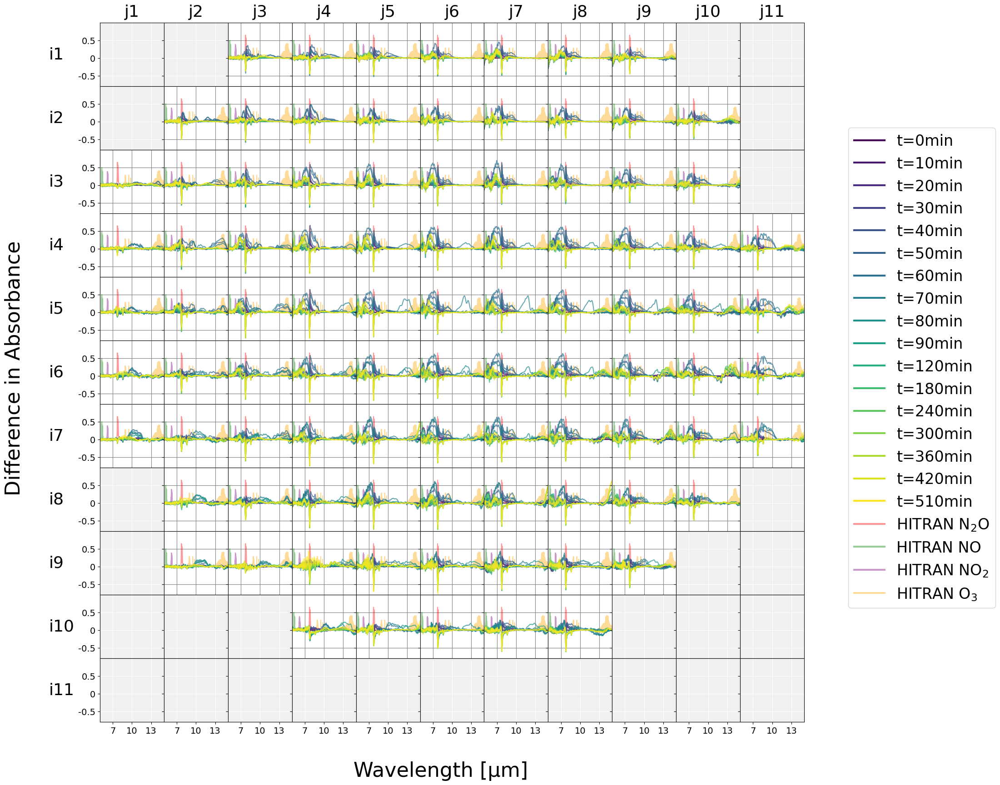

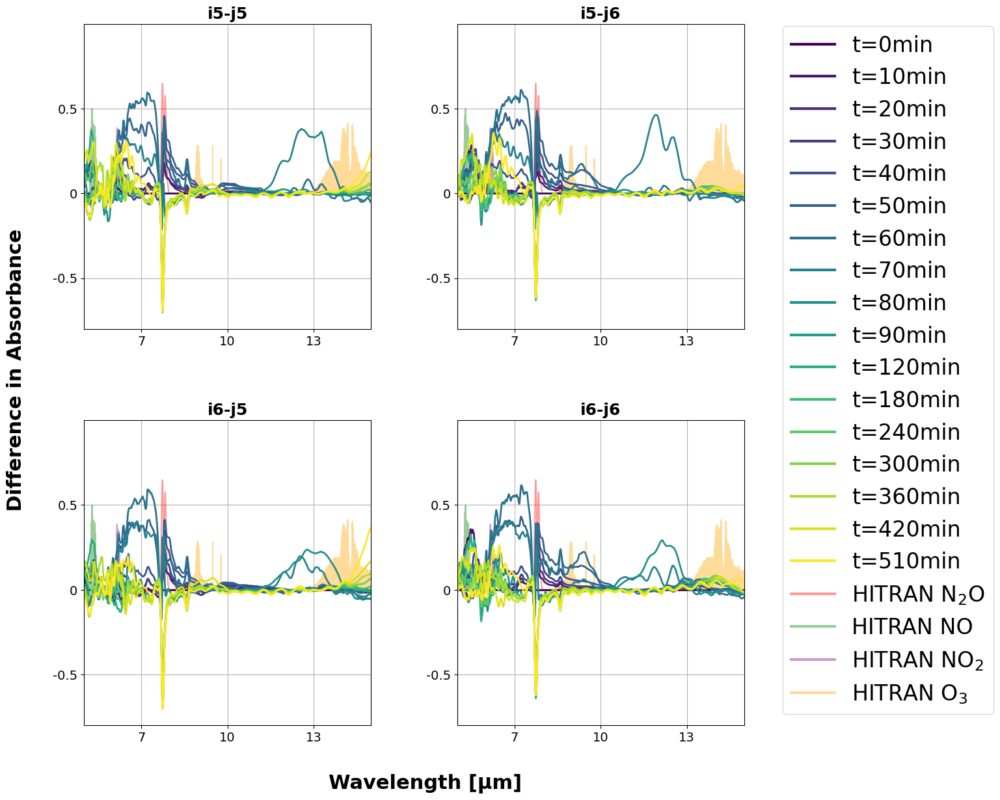

In [ ]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# HITRANデータベースからの分子スペクトルデータの読み込み
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# HITRANデータの数値変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正関数の定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数の定義
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定（全時間）
selected_times = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 120, 180, 240, 300, 360, 420, 510]
selected_time_points = ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144', '1214', '1314', '1414', '1514', '1614', '1714', '1837']

# スペクトル波長範囲の設定
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 時間発展を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_times)))

# メインプロットの設定 - 11×11グリッド
fig, axes = plt.subplots(ybin, xbin, figsize=(20, 20))
plt.subplots_adjust(wspace=0, hspace=0)

# メインの解析ループ - 各グリッドポイントでの処理
for i in range(ybin):
    for j in range(xbin):
        ax = axes[i, j]
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
            
            # 基準スペクトル（0分）の計算
            path_sam_0 = base_path + '1014' + '/'
            Zs_tg_0 = np.load(path_sam_0 + 'tg.npy')
            Zs_ref_0 = np.load(path_ref + 'ref.npy')
            Absorb_0 = np.log10(Zs_ref_0/Zs_tg_0)
            spectrum_0 = np.average(Absorb_0[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline_0 = rolling_ball_baseline(spectrum_0)
            corrected_spectrum_0 = spectrum_0 - baseline_0
            
            # HITRANリファレンスデータのプロット
            ax.plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
            ax.plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
            ax.plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
            ax.plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
            
            # 各時間点での差スペクトル計算とプロット
            for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
                path_sam = base_path + time_point + '/'
                Zs_tg = np.load(path_sam + 'tg.npy')
                Zs_ref = np.load(path_ref + 'ref.npy')
                Absorb = np.log10(Zs_ref/Zs_tg)
                spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
                baseline = rolling_ball_baseline(spectrum)
                corrected_spectrum = spectrum - baseline
                
                # 差スペクトルの計算とプロット
                diff_spectrum = corrected_spectrum - corrected_spectrum_0
                ax.plot(yw, diff_spectrum, color=colors[t_idx], alpha=0.7)
        
        # グラフの基本設定
        ax.grid(True, color='white' if Lpix > r_cir else 'gray')
        ax.set_xlim([5, 15])
        ax.set_ylim([-0.8, 1.0])
        
        # x軸の目盛りを7, 10, 13に設定
        ax.set_xticks([7, 10, 13])
        ax.set_xticklabels(['7', '10', '13'], fontsize=14)
        
        # y軸の目盛りを設定
        ax.set_yticks([-0.5, 0, 0.5])
        ax.set_yticklabels(['-0.5', '0', '0.5'], fontsize=14)
        
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
        
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
        
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=26, pad=10)
        
        # 左側にi1-i11のラベルを表示
        if j == 0:
            ax.text(-0.8, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=26)

# 凡例の設定
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min', linewidth=3.0)
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N$_2$O', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO$_2$', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='orange', label='HITRAN O$_3$', alpha=0.4, linewidth=3.0)
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=time_legend + hitran_legend,
          loc='center left',
          bbox_to_anchor=(0.94, 0.5),
          fontsize=24)

# 全体のラベル設定
fig.text(0.5, 0.05, 'Wavelength [μm]', ha='center', fontsize=32)
fig.text(0.02, 0.5, 'Difference in Absorbance', va='center', rotation='vertical', fontsize=32)

plt.show()

# 拡大表示の設定 - 4つのグリッドポイントのみ
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i方向の表示位置
j_indices = [4, 5]  # j方向の表示位置

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # 基準スペクトル（0分）の計算
        path_sam_0 = base_path + '1014' + '/'
        Zs_tg_0 = np.load(path_sam_0 + 'tg.npy')
        Zs_ref_0 = np.load(path_ref + 'ref.npy')
        Absorb_0 = np.log10(Zs_ref_0/Zs_tg_0)
        spectrum_0 = np.average(Absorb_0[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        baseline_0 = rolling_ball_baseline(spectrum_0)
        corrected_spectrum_0 = spectrum_0 - baseline_0
        
        # HITRANリファレンスデータのプロット
        ax_zoom[idx_i, idx_j].plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
        
        # 各時間点での差スペクトル計算とプロット
        for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
            path_sam = base_path + time_point + '/'
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
            # 差スペクトルの計算と表示
            diff_spectrum = corrected_spectrum - corrected_spectrum_0
            ax_zoom[idx_i, idx_j].plot(yw, diff_spectrum, color=colors[t_idx], linewidth=2.0)
        
                # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.8, 1.0])
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
        ax_zoom[idx_i, idx_j].tick_params(labelsize=14)
        # 拡大表示でも同じ目盛りを使用
        ax_zoom[idx_i, idx_j].set_xticks([7, 10, 13])
        ax_zoom[idx_i, idx_j].set_xticklabels(['7', '10', '13'])
        ax_zoom[idx_i, idx_j].set_yticks([-0.5, 0, 0.5])
        ax_zoom[idx_i, idx_j].set_yticklabels(['-0.5', '0', '0.5'])

# 時間変化とHITRANデータの凡例設定 - 分子種を下付き文字で表示
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min', linewidth=3.0)
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N$_2$O', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO$_2$', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='orange', label='HITRAN O$_3$', alpha=0.4, linewidth=3.0)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=time_legend + hitran_legend,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Difference in Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()

import matplotlib.pyplot as plt

# 縦300×横310ピクセルのPNG画像を生成
plt.figure(figsize=(3.1, 3), dpi=100)  # 310x300ピクセルになるようにサイズ設定

# テキスト内容を設定
plt.text(0.5, 0.5, "2DFT-IR_N2O.ipynb\n\n赤外分光データの時間変化解析\n- 11×11グリッドでの空間分布\n- N2O, NO, NO2, O3の分子スペクトル比較\n- 0〜510分の時間変化追跡", 
         horizontalalignment='center', verticalalignment='center', 
         transform=plt.gca().transAxes, fontsize=9)

# 軸を非表示に
plt.axis('off')

# レイアウト調整
plt.tight_layout()

# 指定サイズでPNG保存
plt.savefig('2DFT-IR_N2O_summary.png', bbox_inches='tight', dpi=100)

# 画像表示（必要に応じて）
plt.show()

# プロットを閉じる
plt.close()


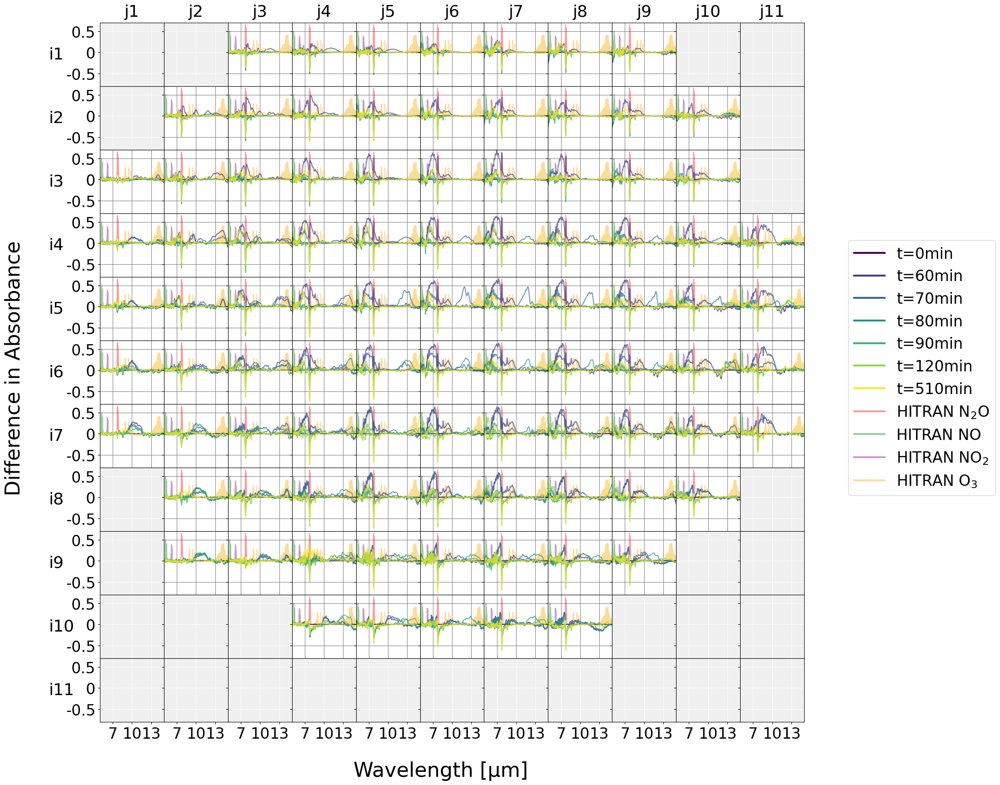

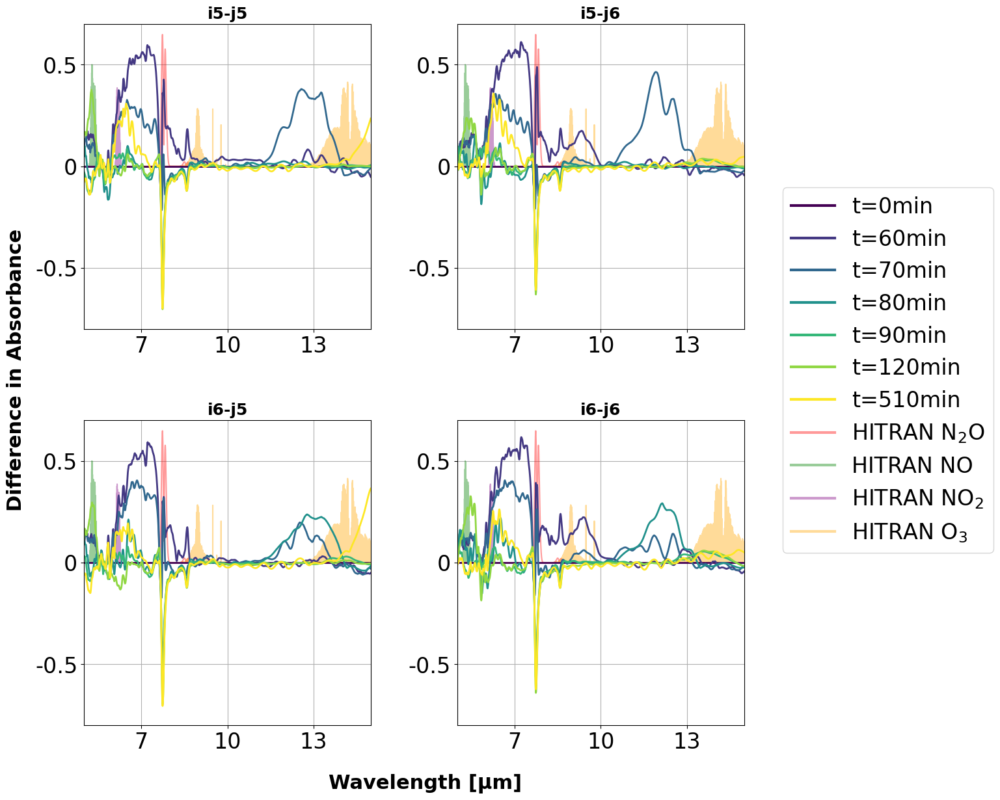

C:\Users\daiki\AppData\Local\Temp\ipykernel_14432\196608913.py:277: UserWarning: Glyph 36196 (\N{CJK UNIFIED IDEOGRAPH-8D64}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\daiki\AppData\Local\Temp\ipykernel_14432\196608913.py:277: UserWarning: Glyph 22806 (\N{CJK UNIFIED IDEOGRAPH-5916}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\daiki\AppData\Local\Temp\ipykernel_14432\196608913.py:277: UserWarning: Glyph 20998 (\N{CJK UNIFIED IDEOGRAPH-5206}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\daiki\AppData\Local\Temp\ipykernel_14432\196608913.py:277: UserWarning: Glyph 20809 (\N{CJK UNIFIED IDEOGRAPH-5149}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\daiki\AppData\Local\Temp\ipykernel_14432\196608913.py:277: UserWarning: Glyph 12487 (\N{KATAKANA LETTER DE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\daiki\AppData\Local\Temp\ipykernel_14432\196608913.py:277: UserWarning: Glyph 12540 (\N{KATAKA

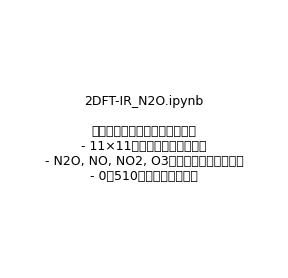

In [1]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# HITRANデータベースからの分子スペクトルデータの読み込み
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# HITRANデータの数値変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正関数の定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数の定義
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定（選択された時間のみ）
selected_times = [0, 60, 70, 80, 90, 120, 510]
selected_time_points = ['1014', '1114', '1124', '1134', '1144', '1214', '1837']

# スペクトル波長範囲の設定
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 時間発展を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_times)))

# メインプロットの設定 - 11×11グリッド
fig, axes = plt.subplots(ybin, xbin, figsize=(20, 20))
plt.subplots_adjust(wspace=0, hspace=0)

# メインの解析ループ - 各グリッドポイントでの処理
for i in range(ybin):
    for j in range(xbin):
        ax = axes[i, j]
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
            
            # 基準スペクトル（0分）の計算
            path_sam_0 = base_path + '1014' + '/'
            Zs_tg_0 = np.load(path_sam_0 + 'tg.npy')
            Zs_ref_0 = np.load(path_ref + 'ref.npy')
            Absorb_0 = np.log10(Zs_ref_0/Zs_tg_0)
            spectrum_0 = np.average(Absorb_0[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline_0 = rolling_ball_baseline(spectrum_0)
            corrected_spectrum_0 = spectrum_0 - baseline_0
            
            # HITRANリファレンスデータのプロット
            ax.plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
            ax.plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
            ax.plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
            ax.plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
            
            # 各時間点での差スペクトル計算とプロット
            for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
                path_sam = base_path + time_point + '/'
                Zs_tg = np.load(path_sam + 'tg.npy')
                Zs_ref = np.load(path_ref + 'ref.npy')
                Absorb = np.log10(Zs_ref/Zs_tg)
                spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
                baseline = rolling_ball_baseline(spectrum)
                corrected_spectrum = spectrum - baseline
                
                # 差スペクトルの計算とプロット
                diff_spectrum = corrected_spectrum - corrected_spectrum_0
                ax.plot(yw, diff_spectrum, color=colors[t_idx], alpha=0.7)
        
        # グラフの基本設定
        ax.grid(True, color='white' if Lpix > r_cir else 'gray')
        ax.set_xlim([5, 15])
        ax.set_ylim([-0.8, 0.7])  # 縦軸範囲を-0.8~0.7に変更
        
        # x軸の目盛りを7, 10, 13に設定（フォントサイズをより大きく）
        ax.set_xticks([7, 10, 13])
        ax.set_xticklabels(['7', '10', '13'], fontsize=24)
        
        # y軸の目盛りを設定（フォントサイズをより大きく）
        ax.set_yticks([-0.5, 0, 0.5])
        ax.set_yticklabels(['-0.5', '0', '0.5'], fontsize=24)
        
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
        
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
        
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=26, pad=10)
        
        # 左側にi1-i11のラベルを表示
        if j == 0:
            ax.text(-0.8, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=26)

# 凡例の設定
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min', linewidth=3.0)
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N$_2$O', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO$_2$', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='orange', label='HITRAN O$_3$', alpha=0.4, linewidth=3.0)
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=time_legend + hitran_legend,
          loc='center left',
          bbox_to_anchor=(0.94, 0.5),
          fontsize=24)

# 全体のラベル設定
fig.text(0.5, 0.05, 'Wavelength [μm]', ha='center', fontsize=32)
fig.text(0.02, 0.5, 'Difference in Absorbance', va='center', rotation='vertical', fontsize=32)

plt.show()

# 拡大表示の設定 - 4つのグリッドポイントのみ
fig_zoom, ax_zoom = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3, wspace=0.3, right=0.85)

# 拡大表示する領域の指定
i_indices = [4, 5]  # i方向の表示位置
j_indices = [4, 5]  # j方向の表示位置

# 拡大表示の作成 - 各グリッドポイントでの処理
for idx_i, i in enumerate(i_indices):
    for idx_j, j in enumerate(j_indices):
        pix_x, pix_y = x0[j], y0[i]
        
        # 基準スペクトル（0分）の計算
        path_sam_0 = base_path + '1014' + '/'
        Zs_tg_0 = np.load(path_sam_0 + 'tg.npy')
        Zs_ref_0 = np.load(path_ref + 'ref.npy')
        Absorb_0 = np.log10(Zs_ref_0/Zs_tg_0)
        spectrum_0 = np.average(Absorb_0[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
        baseline_0 = rolling_ball_baseline(spectrum_0)
        corrected_spectrum_0 = spectrum_0 - baseline_0
        
        # HITRANリファレンスデータのプロット
        ax_zoom[idx_i, idx_j].plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4)
        ax_zoom[idx_i, idx_j].plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4)
        
        # 各時間点での差スペクトル計算とプロット
        for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
            path_sam = base_path + time_point + '/'
            Zs_tg = np.load(path_sam + 'tg.npy')
            Zs_ref = np.load(path_ref + 'ref.npy')
            Absorb = np.log10(Zs_ref/Zs_tg)
            spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline = rolling_ball_baseline(spectrum)
            corrected_spectrum = spectrum - baseline
            
                        # 差スペクトルの計算と表示
            diff_spectrum = corrected_spectrum - corrected_spectrum_0
            ax_zoom[idx_i, idx_j].plot(yw, diff_spectrum, color=colors[t_idx], linewidth=2.0)
        
        # グラフの表示設定
        ax_zoom[idx_i, idx_j].set_xlim([5, 15])
        ax_zoom[idx_i, idx_j].set_ylim([-0.8, 0.7])  # 縦軸範囲を-0.8~0.7に変更
        ax_zoom[idx_i, idx_j].grid(True)
        ax_zoom[idx_i, idx_j].set_title(f'i{i+1}-j{j+1}', fontsize=18, weight='bold')
        
        # 拡大表示でも同じ目盛りを使用（フォントサイズをより大きく）
        ax_zoom[idx_i, idx_j].set_xticks([7, 10, 13])
        ax_zoom[idx_i, idx_j].set_xticklabels(['7', '10', '13'], fontsize=24)
        ax_zoom[idx_i, idx_j].set_yticks([-0.5, 0, 0.5])
        ax_zoom[idx_i, idx_j].set_yticklabels(['-0.5', '0', '0.5'], fontsize=24)

# 時間変化とHITRANデータの凡例設定 - 分子種を下付き文字で表示
time_legend = [plt.Line2D([0], [0], color=colors[i], label=f't={t}min', linewidth=3.0)
               for i, t in enumerate(selected_times)]
hitran_legend = [
    plt.Line2D([0], [0], color='red', label='HITRAN N$_2$O', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='green', label='HITRAN NO', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='purple', label='HITRAN NO$_2$', alpha=0.4, linewidth=3.0),
    plt.Line2D([0], [0], color='orange', label='HITRAN O$_3$', alpha=0.4, linewidth=3.0)
]

# 凡例を右側に配置（大きいフォントサイズ）
fig_zoom.legend(handles=time_legend + hitran_legend,
                loc='center left',
                bbox_to_anchor=(0.88, 0.5),
                fontsize=24)

# 軸ラベルとタイトルの設定（大きいフォントサイズ）
fig_zoom.text(0.5, 0.04, 'Wavelength [μm]', ha='center', fontsize=22, weight='bold')
fig_zoom.text(0.04, 0.5, 'Difference in Absorbance', va='center', rotation='vertical', fontsize=22, weight='bold')

plt.show()

import matplotlib.pyplot as plt

# 縦300×横310ピクセルのPNG画像を生成
plt.figure(figsize=(3.1, 3), dpi=100)  # 310x300ピクセルになるようにサイズ設定

# テキスト内容を設定
plt.text(0.5, 0.5, "2DFT-IR_N2O.ipynb\n\n赤外分光データの時間変化解析\n- 11×11グリッドでの空間分布\n- N2O, NO, NO2, O3の分子スペクトル比較\n- 0〜510分の時間変化追跡", 
         horizontalalignment='center', verticalalignment='center', 
         transform=plt.gca().transAxes, fontsize=9)

# 軸を非表示に
plt.axis('off')

# レイアウト調整
plt.tight_layout()

# 指定サイズでPNG保存
plt.savefig('2DFT-IR_N2O_summary.png', bbox_inches='tight', dpi=100)

# 画像表示（必要に応じて）
plt.show()

# プロットを閉じる
plt.close()

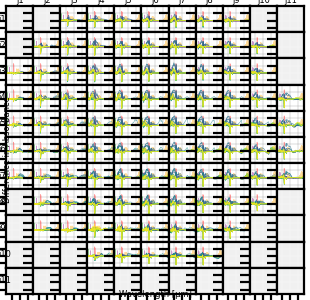

In [1]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate

# フォントサイズの設定を小さくする（小さい画像サイズに合わせて）
rcParams['font.size'] = 2
rcParams['axes.labelsize'] = 2
rcParams['axes.titlesize'] = 2
rcParams['xtick.labelsize'] = 2
rcParams['ytick.labelsize'] = 2
rcParams['legend.fontsize'] = 2
rcParams['figure.titlesize'] = 3

# HITRANデータベースからの分子スペクトルデータの読み込み
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# HITRANデータの数値変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正関数の定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数の定義
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定（全時間）
selected_times = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 120, 180, 240, 300, 360, 420, 510]
selected_time_points = ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144', '1214', '1314', '1414', '1514', '1614', '1714', '1837']

# スペクトル波長範囲の設定
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 時間発展を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_times)))

# メインプロットの設定 - 11×11グリッド (サイズを縦300×横310ピクセル、200dpiに設定)
# 200dpiの場合、インチサイズは 310/200 × 300/200 = 1.55 × 1.5 インチ
fig, axes = plt.subplots(ybin, xbin, figsize=(1.55, 1.5), dpi=200)
plt.subplots_adjust(wspace=0, hspace=0, left=0.02, right=0.98, bottom=0.02, top=0.98)

# メインの解析ループ - 各グリッドポイントでの処理
for i in range(ybin):
    for j in range(xbin):
        ax = axes[i, j]
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
            
            # 基準スペクトル（0分）の計算
            path_sam_0 = base_path + '1014' + '/'
            Zs_tg_0 = np.load(path_sam_0 + 'tg.npy')
            Zs_ref_0 = np.load(path_ref + 'ref.npy')
            Absorb_0 = np.log10(Zs_ref_0/Zs_tg_0)
            spectrum_0 = np.average(Absorb_0[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline_0 = rolling_ball_baseline(spectrum_0)
            corrected_spectrum_0 = spectrum_0 - baseline_0
            
            # HITRANリファレンスデータのプロット
            ax.plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4, linewidth=0.2)
            ax.plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4, linewidth=0.2)
            ax.plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4, linewidth=0.2)
            ax.plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4, linewidth=0.2)
            
            # 各時間点での差スペクトル計算とプロット
            for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
                path_sam = base_path + time_point + '/'
                Zs_tg = np.load(path_sam + 'tg.npy')
                Zs_ref = np.load(path_ref + 'ref.npy')
                Absorb = np.log10(Zs_ref/Zs_tg)
                spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
                baseline = rolling_ball_baseline(spectrum)
                corrected_spectrum = spectrum - baseline
                
                # 差スペクトルの計算とプロット
                diff_spectrum = corrected_spectrum - corrected_spectrum_0
                ax.plot(yw, diff_spectrum, color=colors[t_idx], alpha=0.7, linewidth=0.2)
        
        # グラフの基本設定
        ax.grid(True, color='white' if Lpix > r_cir else 'gray', linewidth=0.1)
        ax.set_xlim([5, 15])
        ax.set_ylim([-0.8, 1.0])
        
        # x軸の目盛りを7, 10, 13に設定
        ax.set_xticks([7, 10, 13])
        ax.set_xticklabels(['7', '10', '13'], fontsize=2)
        
        # y軸の目盛りを設定
        ax.set_yticks([-0.5, 0, 0.5])
        ax.set_yticklabels(['-0.5', '0', '0.5'], fontsize=2)
        
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
        
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
        
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=3, pad=1)
        
        # 左側にi1-i11のラベルを表示
        if j == 0:
            ax.text(-0.3, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=3)

# 凡例は小さいサイズでは省略（必要に応じて別途作成）

# 全体のラベル設定（小さいサイズに合わせて調整）
fig.text(0.5, 0.01, 'Wavelength [μm]', ha='center', fontsize=3)
fig.text(0.01, 0.5, 'Difference in Absorbance', va='center', rotation='vertical', fontsize=3)

# 画像を保存（200dpiで保存）
plt.savefig('2DFT-IR_N2O_grid.png', dpi=200)
plt.close()

# 保存した画像を表示
from IPython.display import Image
Image('2DFT-IR_N2O_grid.png')


In [ ]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import convolve
import pandas as pd
import scipy as scp
from scipy import interpolate

# フォントサイズの設定を小さくする（小さい画像サイズに合わせて）
rcParams['font.size'] = 2
rcParams['axes.labelsize'] = 2
rcParams['axes.titlesize'] = 2
rcParams['xtick.labelsize'] = 2
rcParams['ytick.labelsize'] = 2
rcParams['legend.fontsize'] = 2
rcParams['figure.titlesize'] = 3

# HITRANデータベースからの分子スペクトルデータの読み込み
hitran_n2 = pd.read_excel('Hitran N2O.xlsx', dtype=str)
hitran_no = pd.read_excel('Hitran NO.xlsx', skiprows=2, dtype=str)
hitran_no2 = pd.read_excel('Hitran NO2.xlsx', skiprows=2, dtype=str)
hitran_o3 = pd.read_excel('Hitran O3.xlsx', skiprows=2, dtype=str)

# HITRANデータの数値変換
hitran_n2 = hitran_n2.apply(pd.to_numeric, errors='coerce')
hitran_no = hitran_no.apply(pd.to_numeric, errors='coerce')
hitran_no2 = hitran_no2.apply(pd.to_numeric, errors='coerce')
hitran_o3 = hitran_o3.apply(pd.to_numeric, errors='coerce')

# ベースライン補正関数の定義
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
   
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
   
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
   
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
   
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数の定義
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定（全時間）
selected_times = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 120, 180, 240, 300, 360, 420, 510]
selected_time_points = ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144', '1214', '1314', '1414', '1514', '1614', '1714', '1837']

# スペクトル波長範囲の設定
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
nw = len(yw)

# グリッドサイズの設定
xbin, ybin = 11, 11

# 円形測定領域の定義
x_cir, y_cir, r_cir = 304, 264, 154

# 空間分解能パラメータの設定
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+xbin*sbin, sbin)
y0 = np.arange(yst, yst+ybin*sbin, sbin)

# 時間発展を表現するカラーマップの設定
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_times)))

# メインプロットの設定 - 11×11グリッド (サイズを縦300×横310ピクセル、200dpiに設定)
# 200dpiの場合、インチサイズは 465/200 × 300/200 = 2.325 × 1.5 インチ
fig, axes = plt.subplots(ybin, xbin, figsize=(2.325, 1.5), dpi=200)
plt.subplots_adjust(wspace=0, hspace=0, left=0.02, right=0.98, bottom=0.02, top=0.98)

# メインの解析ループ - 各グリッドポイントでの処理
for i in range(ybin):
    for j in range(xbin):
        ax = axes[i, j]
        pix_x, pix_y = x0[j], y0[i]
        pix_xc, pix_yc = x0[j]+35.0/2.0, y0[i]+35.0/2.0
        
        # 円形測定領域外のマスキング処理
        Lpix = np.sqrt((pix_xc-x_cir)**2+(pix_yc-y_cir)**2)
        if Lpix > r_cir:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
            
            # 基準スペクトル（0分）の計算
            path_sam_0 = base_path + '1014' + '/'
            Zs_tg_0 = np.load(path_sam_0 + 'tg.npy')
            Zs_ref_0 = np.load(path_ref + 'ref.npy')
            Absorb_0 = np.log10(Zs_ref_0/Zs_tg_0)
            spectrum_0 = np.average(Absorb_0[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
            baseline_0 = rolling_ball_baseline(spectrum_0)
            corrected_spectrum_0 = spectrum_0 - baseline_0
            
            # HITRANリファレンスデータのプロット
            ax.plot(hitran_n2.iloc[:, 1], hitran_n2.iloc[:, 2], '-', color='red', alpha=0.4, linewidth=0.2)
            ax.plot(hitran_no.iloc[:, 1], hitran_no.iloc[:, 2], '-', color='green', alpha=0.4, linewidth=0.2)
            ax.plot(hitran_no2.iloc[:, 1], hitran_no2.iloc[:, 2], '-', color='purple', alpha=0.4, linewidth=0.2)
            ax.plot(hitran_o3.iloc[:, 1], hitran_o3.iloc[:, 2], '-', color='orange', alpha=0.4, linewidth=0.2)
            
            # 各時間点での差スペクトル計算とプロット
            for t_idx, (t, time_point) in enumerate(zip(selected_times, selected_time_points)):
                path_sam = base_path + time_point + '/'
                Zs_tg = np.load(path_sam + 'tg.npy')
                Zs_ref = np.load(path_ref + 'ref.npy')
                Absorb = np.log10(Zs_ref/Zs_tg)
                spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
                baseline = rolling_ball_baseline(spectrum)
                corrected_spectrum = spectrum - baseline
                
                # 差スペクトルの計算とプロット
                diff_spectrum = corrected_spectrum - corrected_spectrum_0
                ax.plot(yw, diff_spectrum, color=colors[t_idx], alpha=0.7, linewidth=0.2)
        
        # グラフの基本設定
        ax.grid(True, color='white' if Lpix > r_cir else 'gray', linewidth=0.1)
        ax.set_xlim([5, 15])
        ax.set_ylim([-0.8, 1.0])
        
        # x軸の目盛りを7, 10, 13に設定
        ax.set_xticks([7, 10, 13])
        ax.set_xticklabels(['7', '10', '13'], fontsize=2)
        
        # y軸の目盛りを設定
        ax.set_yticks([-0.5, 0, 0.5])
        ax.set_yticklabels(['-0.5', '0', '0.5'], fontsize=2)
        
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
        
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
        
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=3, pad=1)
        
        # 左側にi1-i11のラベルを表示
        if j == 0:
            ax.text(-0.3, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=3)

# 凡例は小さいサイズでは省略（必要に応じて別途作成）

# 全体のラベル設定（小さいサイズに合わせて調整）
fig.text(0.5, 0.01, 'Wavelength [μm]', ha='center', fontsize=3)
fig.text(0.01, 0.5, 'Difference in Absorbance', va='center', rotation='vertical', fontsize=3)

# 画像を保存（200dpiで保存）
plt.savefig('2DFT-IR_N2O_grid.png', dpi=200)
plt.close()

# 保存した画像を表示
from IPython.display import Image
Image('2DFT-IR_N2O_grid.png')

FileNotFoundError: No such file or directory: '2DFT-IR_N2O_grid_2.png'

FileNotFoundError: No such file or directory: '2DFT-IR_N2O_grid_2.png'

<IPython.core.display.Image object>